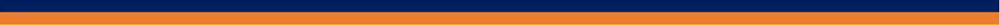


<h1><center><font size=10><a name='link6'>Data Science and Business Analytics</a></center></font></h1>


<h1><center> Practice Project 25 </center></h1>

<h1><center>Dashboard for Store Dataset </center></h1>



<h1><center> By </center></h1>



<h1><center>Hayford Osumanu </center></h1>



<h1><center>April  2023 </center></h1>


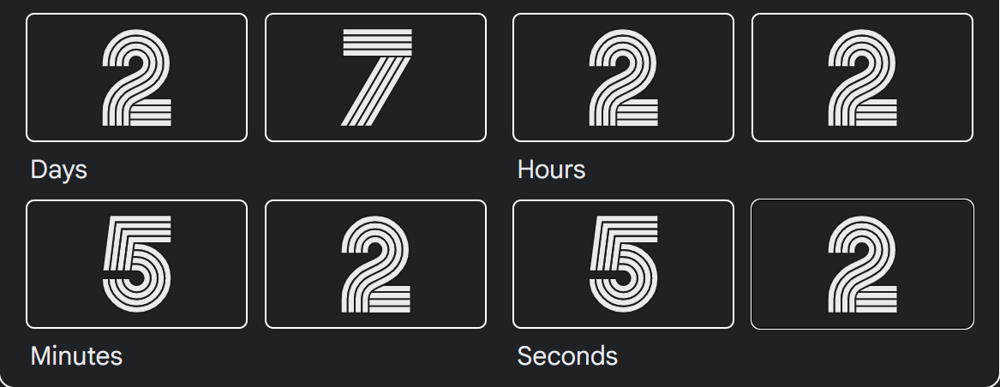

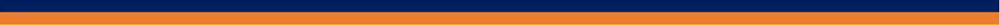

<img src="https://media1.giphy.com/media/B1xUp52rUnrv1Leakw/giphy.gif?cid=ecf05e474uu1n7n5jvml69duzey3lgtcwowq6txw47ktbfpq&rid=giphy.gif&ct=g.gif" width="750" height="500" align="center">

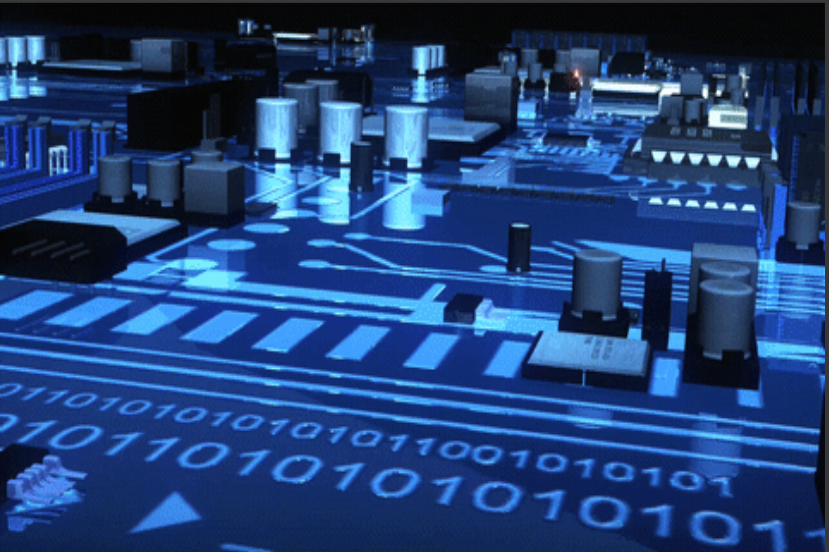

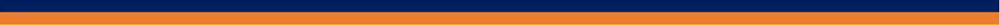

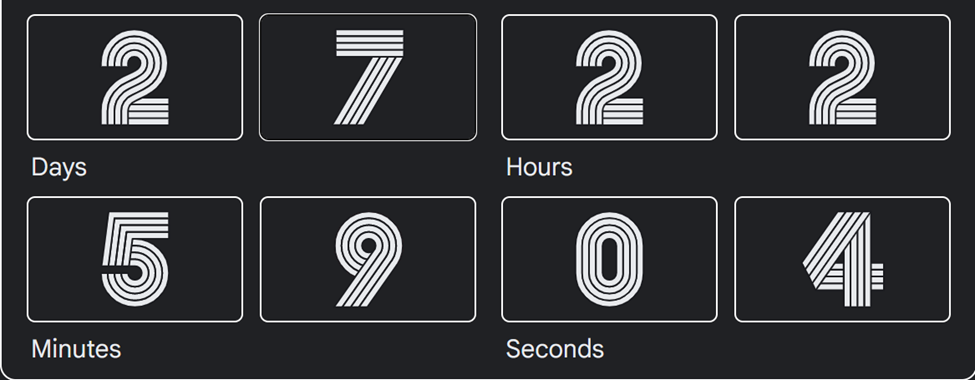

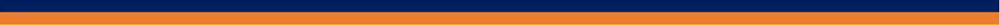

# <h1><left><font size=8><a name='link6'>Data Analysis Philosophy</a></center></font></h1>

In [ ]:
import this

The Zen of Python, by Tim Peters

Beautiful is better than ugly.
Explicit is better than implicit.
Simple is better than complex.
Complex is better than complicated.
Flat is better than nested.
Sparse is better than dense.
Readability counts.
Special cases aren't special enough to break the rules.
Although practicality beats purity.
Errors should never pass silently.
Unless explicitly silenced.
In the face of ambiguity, refuse the temptation to guess.
There should be one-- and preferably only one --obvious way to do it.
Although that way may not be obvious at first unless you're Dutch.
Now is better than never.
Although never is often better than *right* now.
If the implementation is hard to explain, it's a bad idea.
If the implementation is easy to explain, it may be a good idea.
Namespaces are one honking great idea -- let's do more of those!


<IPython.core.display.Javascript object>

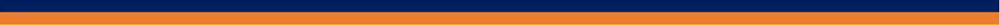

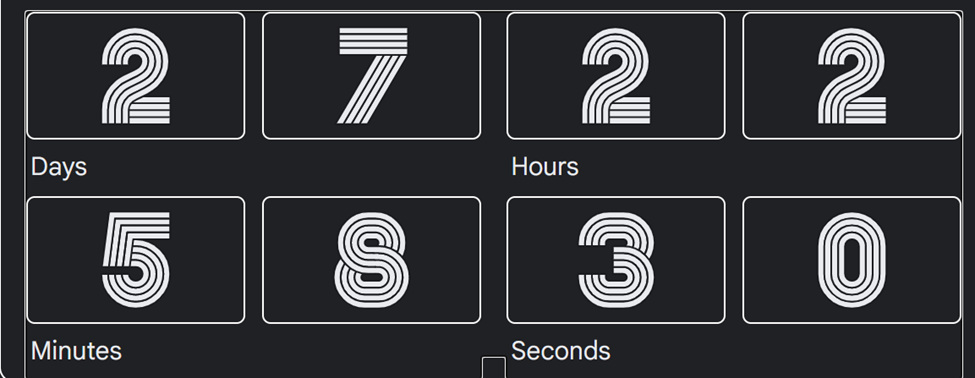

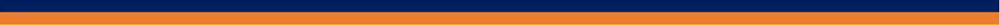

In [ ]:
# installing the needed upgrade optimum performance
!pip install nb_black
!pip install ipython --upgrade
!pip install xgboost
# installing the needed upgrade optimum performance
!pip install squarify
!pip3 install folium==0.5.0
# installing the needed upgrade optimum performance
!pip install plotly==5.13.0
!pip install dash
!pip install jupyter-dash
!pip install tensorflow
# installing Panel 
!pip3 install hvplot jupyterlab
!pip install ipywidgets
!pip install --upgrade holoviews hvplot panel param
!pip install holoviews, 
!pip install hvplot

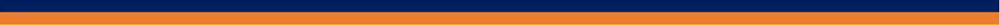

In [2]:
import pandas as pd
import numpy as np
import panel as pn
pn.extension('tabulator')

import hvplot.pandas

In [3]:
# this will help in making the Python code more structured automatically (good coding practice)
#%load_ext nb_black

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns



# split the data into train and test
from sklearn.model_selection import train_test_split

# to build linear regression_model
from sklearn.linear_model import LinearRegression

# to check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# to build linear regression_model using statsmodels
import statsmodels.api as sm

# to compute VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# # Command to tell Python to actually display the graphs
%matplotlib inline
pd.set_option('display.float_format', lambda x: '%.2f' % x) # To supress numerical display in scientific notations

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200);

import warnings

warnings.filterwarnings("ignore")

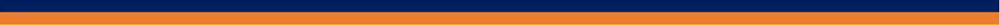

# <h1><left><font size=8><a name='link6'>Importing the Dataset into DataFrame</a></center></font></h1>

In [6]:
path="https://raw.githubusercontent.com/hayfordosmandata/DataBank/main/StoreData2.csv"

In [7]:
Store_data=pd.read_csv(path)
# copying data to another variable to avoid any changes to original data
data = Store_data.copy()

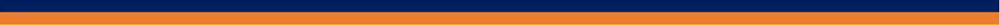

# <h1><left><font size=8><a name='link6'>Part I: Dataset Overview </a></center></font></h1>

In [8]:
# Creating  a well readable header label
for header in data.columns:
    header_replace = header.replace(
        " ", "_"
    )  # creates new header with "_" instead of " ".
    data.rename(
        {header: header_replace}, axis=1, inplace=True
    )  # sets new header as header made in line above

In [9]:
import panel as pn
import seaborn as sb

# Create a Tabulator widget with pagination
table = pn.widgets.Tabulator(data.head(5000), pagination='remote')

# Display the widget in a Panel
panel = pn.Column('## First 20 Rows for Cars Dataset with Pages', table)
panel.servable()

Column
    [0] Markdown(str)
    [1] Tabulator(pagination='remote', value=    ID_Number  ...)

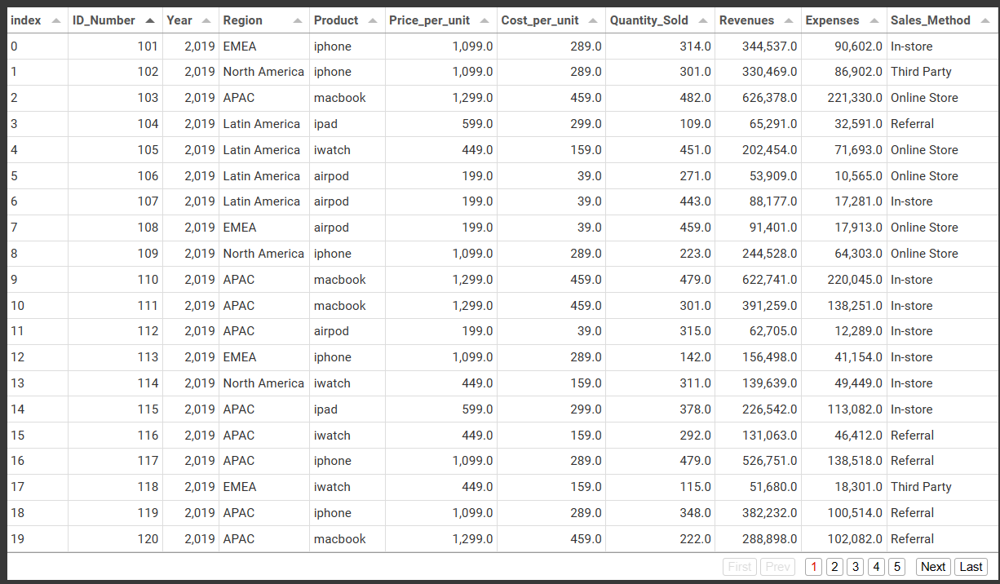

image.png

### Columns/Variable/Features of the Dataset

In [10]:
# Extracting the columns/variables of the dataset
data.columns

Index(['ID_Number', 'Year', 'Region', 'Product', 'Price_per_unit',
       'Cost_per_unit', 'Quantity_Sold', 'Revenues', 'Expenses',
       'Sales_Method'],
      dtype='object')

The data in the tables above contains information of different attributes of  Customers based on their transaction history. The detailed data dictionary is given below.

image.png

### Dimension of the Dataset

In [11]:
# checking the shape of the data
print(f"There are {data.shape[0]} rows and {data.shape[1]} columns.")

There are 100 rows and 10 columns.


In [12]:
# Checking the dimension (number of observations/rows and variables/columns of the Dataset (df.shape)
print("There are", data.shape[0], "rows and", data.shape[1], "columns.")

There are 100 rows and 10 columns.


image.png

### Data Types of the Dataset

In [13]:
# Checking the data types of the variables/columns for the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ID_Number       100 non-null    int64  
 1   Year            100 non-null    int64  
 2   Region          100 non-null    object 
 3   Product         100 non-null    object 
 4   Price_per_unit  100 non-null    float64
 5   Cost_per_unit   100 non-null    float64
 6   Quantity_Sold   100 non-null    float64
 7   Revenues        100 non-null    float64
 8   Expenses        100 non-null    float64
 9   Sales_Method    100 non-null    object 
dtypes: float64(5), int64(2), object(3)
memory usage: 7.9+ KB


image.png

## Data Sanity Checks: Deep Checking/scrutinity of the the dataset before EDA

### Checking the Missing Values of the Dataset

In [14]:
# Checking for missing values in the dataset
data.isnull().sum()

ID_Number         0
Year              0
Region            0
Product           0
Price_per_unit    0
Cost_per_unit     0
Quantity_Sold     0
Revenues          0
Expenses          0
Sales_Method      0
dtype: int64

In [15]:
# Checking the total number of missing values in the dataset
data.isnull().sum().sum()

0

In [16]:
missing_data = data.isnull()
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("")    

ID_Number
False    100
Name: ID_Number, dtype: int64

Year
False    100
Name: Year, dtype: int64

Region
False    100
Name: Region, dtype: int64

Product
False    100
Name: Product, dtype: int64

Price_per_unit
False    100
Name: Price_per_unit, dtype: int64

Cost_per_unit
False    100
Name: Cost_per_unit, dtype: int64

Quantity_Sold
False    100
Name: Quantity_Sold, dtype: int64

Revenues
False    100
Name: Revenues, dtype: int64

Expenses
False    100
Name: Expenses, dtype: int64

Sales_Method
False    100
Name: Sales_Method, dtype: int64



image.png

### Checking the Duplicates in the Dataset

In [17]:
# let's check for duplicate values in the data
data.groupby(data.duplicated(subset=None, keep="first"), as_index=False).size()

,index,size
0,False,100


In [18]:
# checking for duplicate values
print("There are about: ", data.duplicated().sum(), "dupplicates in the dataset")

There are about:  0 dupplicates in the dataset


In [19]:
# deleting the unnecessary columns (RowNumber, CustomerId, Surname)
data.drop(['ID_Number'], axis=1, inplace=True)

In [20]:
#Lest create log transformation to normalize the Revenues and Expenses variable
data["Revenues_log"] = np.log(data["Revenues"])
data["Expenses_log"] = np.log(data["Expenses"])

In [21]:
import panel as pn
import seaborn as sb

# Create a Tabulator widget with pagination
table = pn.widgets.Tabulator(data.head(5000), pagination='remote')

# Display the widget in a Panel
panel = pn.Column('## First 20 Rows for Cars Dataset with Pages', table)
panel.servable()

Column
    [0] Markdown(str)
    [1] Tabulator(pagination='remote', value=    Year      ...)

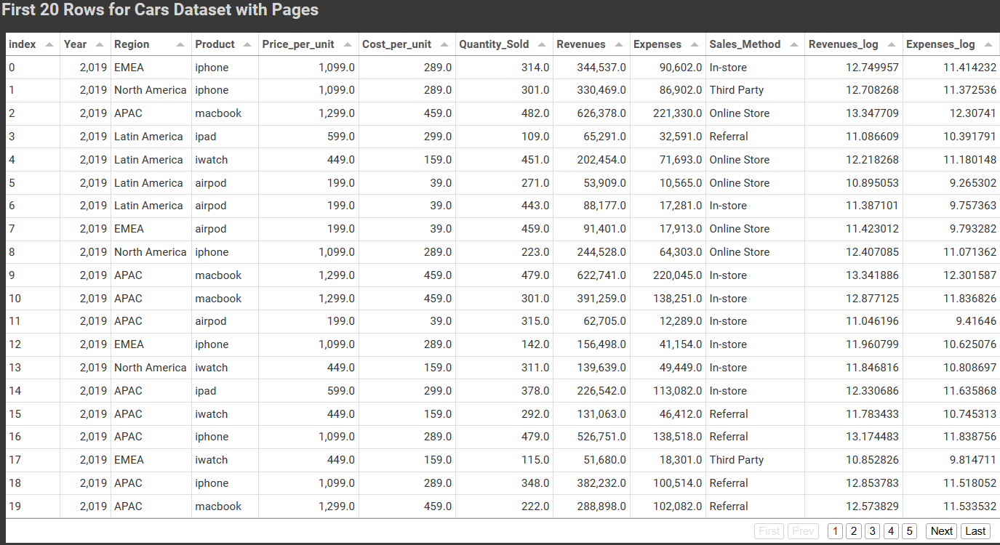

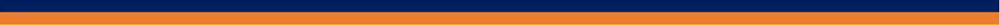

# <h1><left><font size=8><a name='link6'>Part II: Panel Dashboard Overview </a></center></font></h1>

In [ ]:
data.columns

Index(['Year', 'Region', 'Product', 'Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses', 'Sales_Method', 'Revenues_log',
       'Expenses_log'],
      dtype='object')

In [22]:
num=['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']

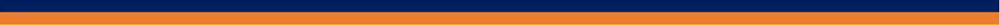

## Dash 0: Outlier Detection Using Boxplot

In [23]:
import panel as pn
import pandas as pd
import hvplot.pandas

# Load your dataset into a DataFrame
#df = pd.read_csv('your_dataset.csv')

# Create a list of options for the drop-down menu
options = [ 'Year', 'Region', 'Product', 'Sales_Method']

# Create the drop-down menu widget
dropdown = pn.widgets.Select(name='Select Column:', options=options)

# Function to update the chart based on the selected value from the drop-down menu
@pn.depends(dropdown.param.value)
def update_chart(column):
    # Create a chart based on the selected column
    return data.hvplot.bar(column, color="red",width=1200, height=500)

# Create a Panel layout with the drop-down menu and chart
dashboard = pn.Column(dropdown, update_chart)

# Create a standalone server for the dashboard
dashboard.servable()

# Embed the dashboard in your notebook
#pn.panel(dashboard).embed()

Column
    [0] Select(options=['Year', 'Region', ...], value='Year')
    [1] ParamFunction(function, _pane=HoloViews)

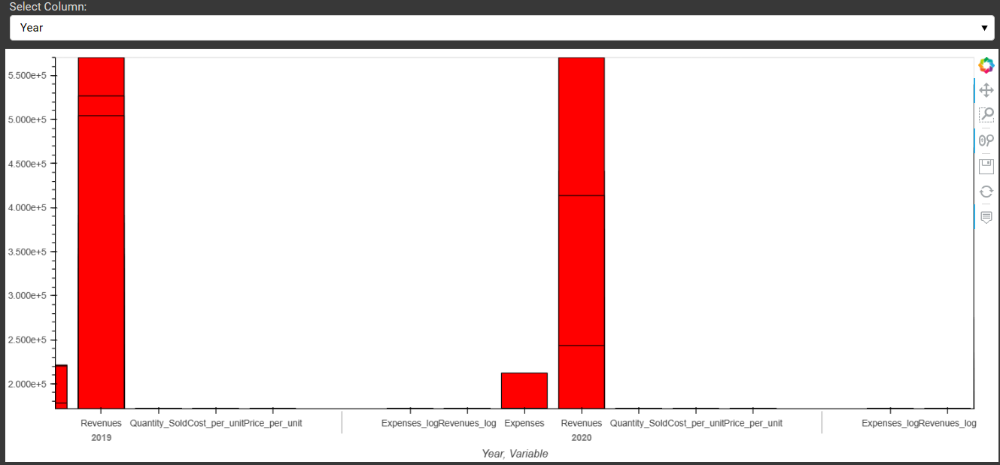

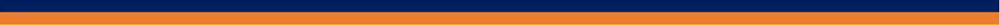

## Dash I: Select different Types of Charts Using Different Variables

In [26]:
import pandas as pd
import panel as pn
import hvplot.pandas

# Define the dropdown menu options [ALL Columns]
column_options = [ 'Year', 'Region', 'Product', 'Sales_Method']
dropdown_scatter = pn.widgets.Select(options=column_options, name='Select a column for X-axis')
dropdown_box = pn.widgets.Select(options=column_options, name='Select a column')


# Creat Bar Charts
bar_plot1 = data.hvplot.bar( x='Year', stacked=True, title='Bar Plot1',width=1200, height=500)
bar_plot2 = data.hvplot.bar( x='Region', stacked=True, title='bar Plot2',width=1200, height=500)
bar_plot3 = data.hvplot.bar( x='Product', stacked=True, title='Bar Plot3',width=1200, height=500)
bar_plot4 = data.hvplot.bar( x='Sales_Method', stacked=True, title='Bar Plot4',width=1200, height=500)
# Create a Panel layout with the charts and statistics

dashboard = pn.Tabs(
    ('Bar Plot1', bar_plot1),
    ('Bar Plot2', bar_plot2),
    ('Bar Plot3', bar_plot3),
    ('Bar Plot4', bar_plot4)
)  
# Create a standalone server for the dashboard
dashboard.servable()

Tabs
    [0] HoloViews(Bars, height=500, name='Bar Plot1', sizing_mode='fixed', width=1200)
    [1] HoloViews(Bars, height=500, name='Bar Plot2', sizing_mode='fixed', width=1200)
    [2] HoloViews(Bars, height=500, name='Bar Plot3', sizing_mode='fixed', width=1200)
    [3] HoloViews(Bars, height=500, name='Bar Plot4', sizing_mode='fixed', width=1200)

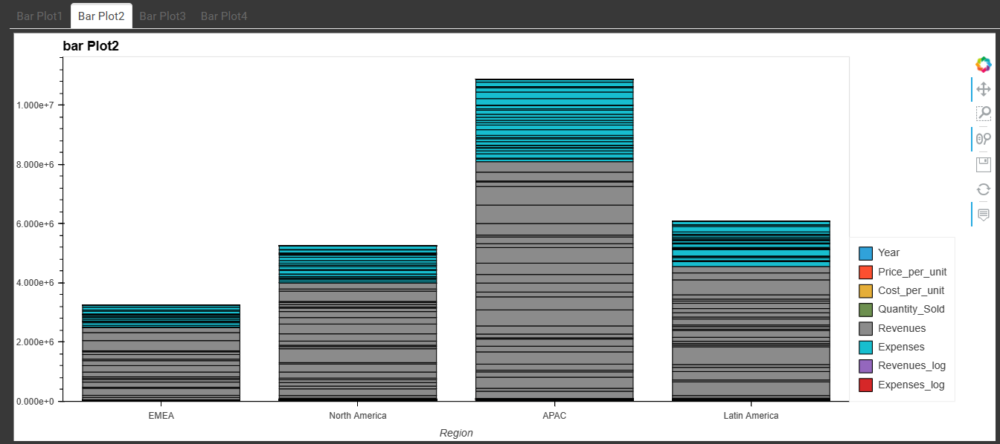

In [27]:
import panel as pn
import pandas as pd
import hvplot.pandas

# Load your dataset into a DataFrame
#df = pd.read_csv('your_dataset.csv')

# Create a list of options for the drop-down menu
options = [ 'Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']

# Create the drop-down menu widget
dropdown = pn.widgets.Select(name='Select Column:', options=options)

# Function to update the chart based on the selected value from the drop-down menu
@pn.depends(dropdown.param.value)
def update_chart(column):
    # Create a chart based on the selected column
    return data.hvplot.box(column, color="lime")

# Create a Panel layout with the drop-down menu and chart
dashboard = pn.Column(dropdown, update_chart)

# Create a standalone server for the dashboard
dashboard.servable()

# Embed the dashboard in your notebook
#pn.panel(dashboard).embed()

Column
    [0] Select(options=['Price_per_unit', ...], value='Price_per_unit')
    [1] ParamFunction(function, _pane=HoloViews)

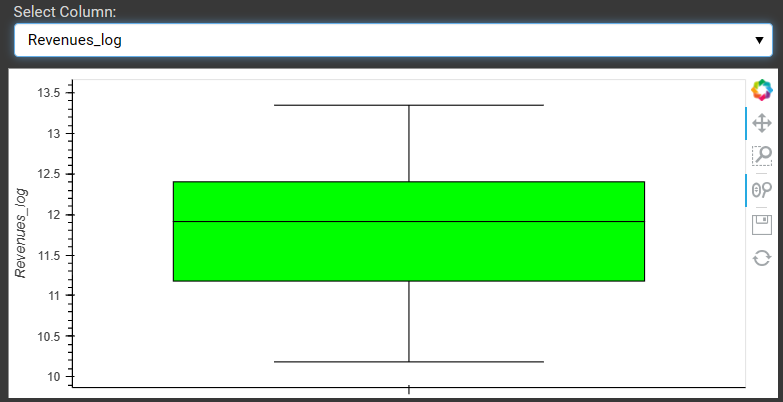

In [28]:
import panel as pn
import pandas as pd
import hvplot.pandas

# Load your dataset into a DataFrame
#df = pd.read_csv('your_dataset.csv')

# Create a list of options for the drop-down menu
options = [ 'Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']

# Create the drop-down menu widget
dropdown = pn.widgets.Select(name='Select Column:', options=options)

# Function to update the chart based on the selected value from the drop-down menu
@pn.depends(dropdown.param.value)
def update_chart(column):
    # Create a chart based on the selected column
    return data.hvplot.kde(column, color="lime")

# Create a Panel layout with the drop-down menu and chart
dashboard = pn.Column(dropdown, update_chart)

# Create a standalone server for the dashboard
dashboard.servable()

# Embed the dashboard in your notebook
#pn.panel(dashboard).embed()

Column
    [0] Select(options=['Price_per_unit', ...], value='Price_per_unit')
    [1] ParamFunction(function, _pane=HoloViews)

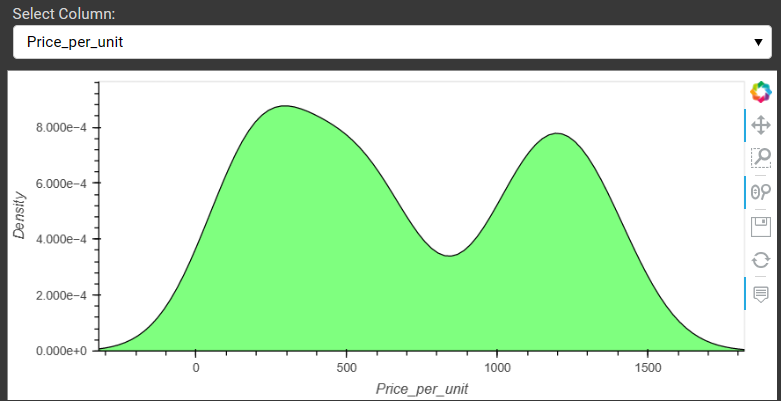

In [29]:
import panel as pn
import pandas as pd
import hvplot.pandas

# Load your dataset into a DataFrame
#df = pd.read_csv('your_dataset.csv')

# Create a list of options for the drop-down menu
options = ['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']

# Create the drop-down menu widget
dropdown = pn.widgets.Select(name='Select Column:', options=options)

# Function to update the chart based on the selected value from the drop-down menu
@pn.depends(dropdown.param.value)
def update_chart(column):
    # Create a chart based on the selected column
    return data.hvplot.violin(column, color="lime")

# Create a Panel layout with the drop-down menu and chart
dashboard = pn.Column(dropdown, update_chart)

# Create a standalone server for the dashboard
dashboard.servable()

# Embed the dashboard in your notebook
#pn.panel(dashboard).embed()

Column
    [0] Select(options=['Price_per_unit', ...], value='Price_per_unit')
    [1] ParamFunction(function, _pane=HoloViews)

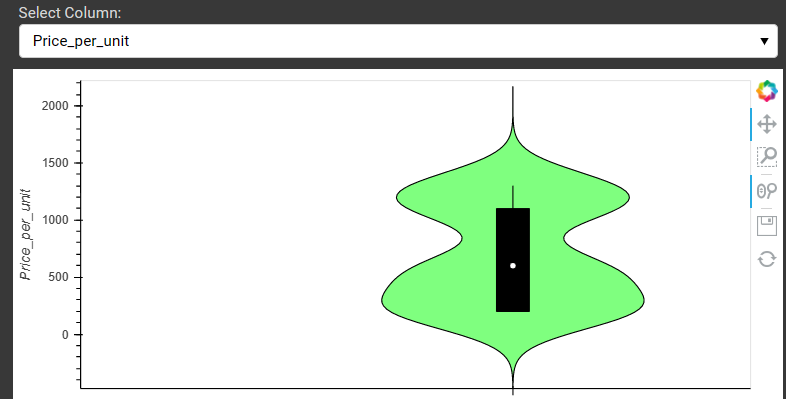

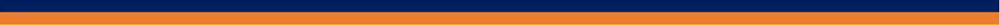

In [30]:
# selecting numerical columns
cols = data.select_dtypes(include=np.number).columns.tolist()

## Dash II:Distribution of Different Variables

In [32]:
import pandas as pd
import panel as pn
import hvplot.pandas
import holoviews as hv


# Define the available columns for the dropdowns
columns = data.select_dtypes(include=np.number).columns.tolist()

# Define the available plot types for the dropdown
plot_types = {
    'Displot': 'hist',
    'Boxplot': 'box',
    'Line Chart': 'line',
    'Scatter Plot': 'scatter'
}

# Define the plots
def get_plots(column_x, column_y, plot_type):
    if plot_type == 'hist':
        plot = data.hvplot.hist(column_x, title=f'{column_x} Distribution')
    elif plot_type == 'box':
        plot = data.hvplot.box(y=column_y, by='sex', title=f'{column_y} Distribution')
    elif plot_type == 'line':
        plot = data.hvplot.line(column_x, column_y, title=f'{column_y} by {column_x}')
    elif plot_type == 'scatter':
        plot = data.hvplot.scatter(column_x, column_y, c='sex', cmap='viridis', title=f'{column_y} vs {column_x}')
    return plot

# Define the dropdown widgets
dropdown_x = pn.widgets.Select(name='Horizontal Variables', options=columns)
dropdown_y = pn.widgets.Select(name='Vertical Variables', options=columns)
dropdown_plot_type = pn.widgets.Select(name='Plot Type', options=plot_types)

def update_plots(*events):
    # Get the current values of the dropdown widgets
    column_x = dropdown_x.value
    column_y = dropdown_y.value
    plot_type = dropdown_plot_type.value

    # Generate the plot based on the selected values
    plot = get_plots(column_x, column_y, plot_type)

    # Update the panel with the new plot
    plot_panel[1] = pn.pane.HoloViews(plot)

# Bind the dropdowns to the update function
dropdown_x.param.watch(update_plots, 'value')
dropdown_y.param.watch(update_plots, 'value')
dropdown_plot_type.param.watch(update_plots, 'value')

# Create a layout for the plots and dropdowns
plot_panel = pn.Column(
    pn.Row(dropdown_x, dropdown_y, dropdown_plot_type),
    pn.pane.HoloViews(),
    sizing_mode='stretch_width'
)

# Serve the dashboard
update_plots(None)
plot_panel.servable()


Column(sizing_mode='stretch_width')
    [0] Row
        [0] Select(name='Horizontal Variables', options=['Year', 'Price_per_unit',...], value='Year')
        [1] Select(name='Vertical Variables', options=['Year', 'Price_per_unit',...], value='Year')
        [2] Select(name='Plot Type', options={'Displot': 'hist', ...}, value='hist')
    [1] HoloViews(Histogram, height=300, sizing_mode='fixed', width=700)

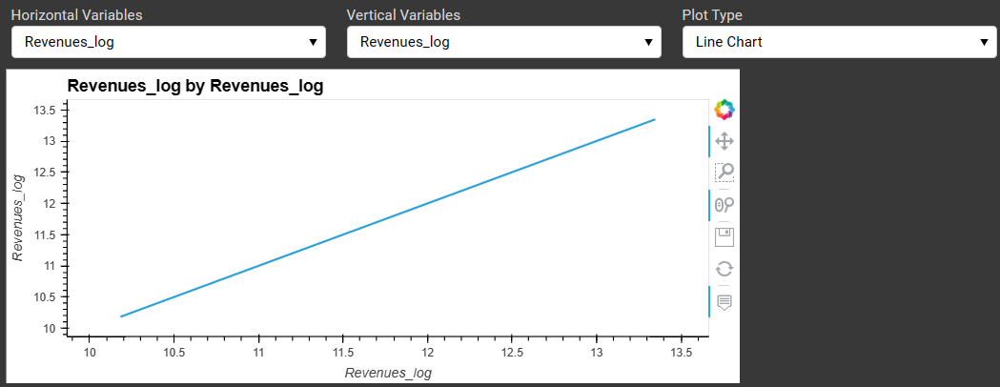

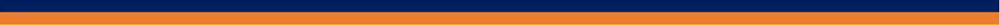

In [34]:
import pandas as pd
import panel as pn
import hvplot.pandas
import holoviews as hv

# Load data (not shown)
#data = pd.read_csv('my_data.csv')

# Define the available columns for the dropdowns
columns = data.select_dtypes(include=np.number).columns.tolist()

# Define the available plot types for the dropdown
plot_types = {
    'Histogram': 'hist',
    'Boxplot': 'box',
    'Line Chart': 'line',
    'Scatter Plot': 'scatter',
    'Violin Plot': 'violin',
    'Displot': 'kde',
    'Summary Statistics Table': 'table',
    'Heatmap': 'heatmap'
}

# Define the plots
def get_plots(column_x, column_y, plot_type):
    if plot_type == 'hist':
        plot = data.hvplot.hist(column_x, title=f'{column_x} Distribution')
    elif plot_type == 'box':
        plot = data.hvplot.box(y=column_y, title=f'{column_y} Distribution', groupby=None)
    elif plot_type == 'line':
        plot = data.hvplot.line(column_x, column_y, title=f'{column_y} by {column_x}')
    elif plot_type == 'scatter':
        plot = data.hvplot.scatter(column_x, column_y, c='color', cmap='viridis', title=f'{column_y} vs {column_x}')
    elif plot_type == 'violin':
        plot = data.hvplot.violin(column_x, column_y, title=f'{column_y} by {column_x}', groupby=None)
    elif plot_type == 'kde':
        plot = data.hvplot.kde(column_x, title=f'{column_x} Distribution')
    elif plot_type == 'table':
        plot = hv.Table(data[column_x].describe())
    elif plot_type == 'heatmap':
        plot = hv.HeatMap(data.corr())
    return plot

# Define the dropdown widgets
dropdown_x = pn.widgets.Select(name='Horizontal Variables', options=columns)
dropdown_y = pn.widgets.Select(name='Vertical Variables', options=columns)
dropdown_plot_type = pn.widgets.Select(name='Plot Type', options=plot_types)

def update_plots(*events):
    # Get the current values of the dropdown widgets
    column_x = dropdown_x.value
    column_y = dropdown_y.value
    plot_type = dropdown_plot_type.value

    # Generate the plot based on the selected values
    plot = get_plots(column_x, column_y, plot_type)

    # Update the panel with the new plot
    plot_panel[1] = pn.pane.HoloViews(plot)

# Bind the dropdowns to the update function
dropdown_x.param.watch(update_plots, 'value')
dropdown_y.param.watch(update_plots, 'value')
dropdown_plot_type.param.watch(update_plots, 'value')

# Create a layout for the plots and dropdowns
plot_panel = pn.Column(
    pn.Row(dropdown_x, dropdown_y, dropdown_plot_type),
    pn.pane.HoloViews(),
    sizing_mode='stretch_width'
)

# Serve the dashboard
update_plots(None)
plot_panel.servable()


Column(sizing_mode='stretch_width')
    [0] Row
        [0] Select(name='Horizontal Variables', options=['Year', 'Price_per_unit',...], value='Year')
        [1] Select(name='Vertical Variables', options=['Year', 'Price_per_unit',...], value='Year')
        [2] Select(name='Plot Type', options={'Histogram': 'hist', ...}, value='hist')
    [1] HoloViews(Histogram, height=300, sizing_mode='fixed', width=700)

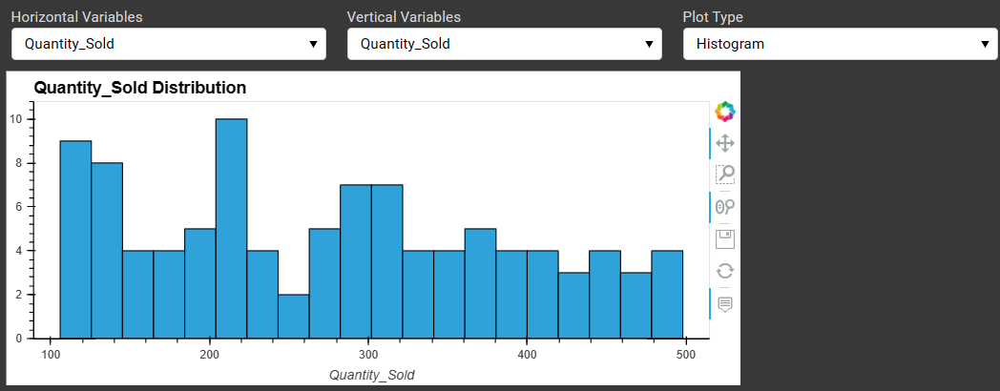

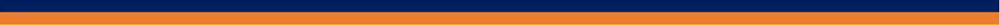

## DashII: Multivariate Distribution of Different Variables

In [ ]:
columns = list(data.columns[0:-3])

x = pn.widgets.Select(value='Quantity_Sold', options=columns, name='Horizontal Variables')
y = pn.widgets.Select(value='Revenues_log', options=columns, name='Vertical Variables')

pn.Row(pn.Column('## Select Feature Option', x, y),
       pn.bind(data.hvplot.scatter, x, y, by="Sales_Method"))

Row
    [0] Column
        [0] Markdown(str)
        [1] Select(name='Horizontal Variables', options=['Year', 'Region', ...], value='Quantity_Sold')
        [2] Select(name='Vertical Variables', options=['Year', 'Region', ...], value='Year')
    [1] ParamFunction(function, _pane=HoloViews)

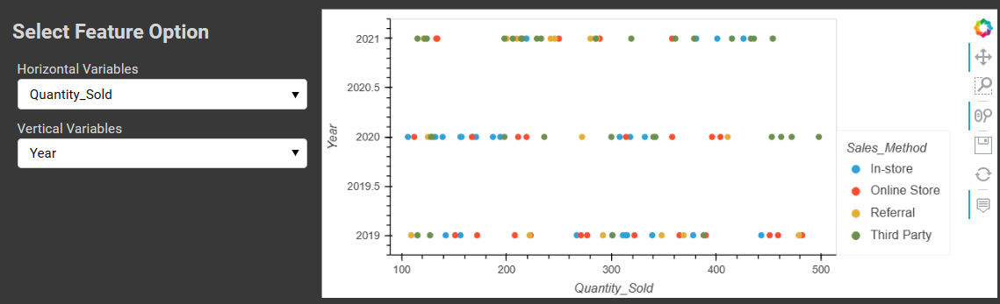

In [ ]:
columns = list(data.columns[0:-3])

x = pn.widgets.Select(value='Quantity_Sold', options=columns, name='Horizontal Variables')
y = pn.widgets.Select(value='Revenues_log', options=columns, name='Vertical Variables')

pn.Row(pn.Column('## Select Feature Option', x, y),
       pn.bind(data.hvplot.scatter, x, y, by="Region"))

Row
    [0] Column
        [0] Markdown(str)
        [1] Select(name='Horizontal Variables', options=['Year', 'Region', ...], value='Quantity_Sold')
        [2] Select(name='Vertical Variables', options=['Year', 'Region', ...], value='Year')
    [1] ParamFunction(function, _pane=HoloViews)

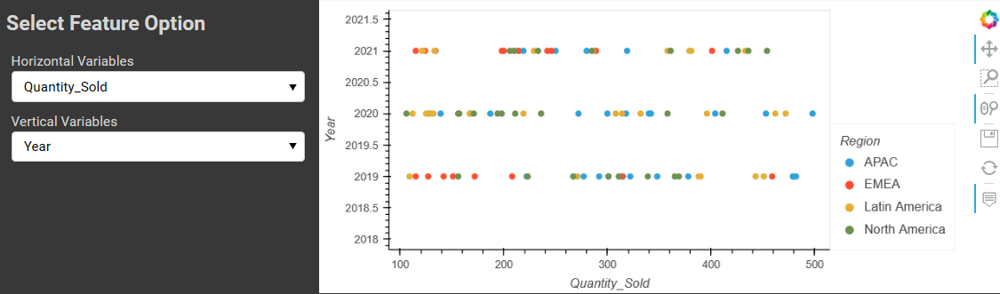

In [ ]:
columns = list(data.columns[0:-3])

x = pn.widgets.Select(value='Quantity_Sold', options=columns, name='Horizontal Variables')
y = pn.widgets.Select(value='Revenues_log', options=columns, name='Vertical Variables')

pn.Row(pn.Column('## Select Feature Option', x, y),
       pn.bind(data.hvplot.scatter, x, y, by="Product"))

Row
    [0] Column
        [0] Markdown(str)
        [1] Select(name='Horizontal Variables', options=['Year', 'Region', ...], value='Quantity_Sold')
        [2] Select(name='Vertical Variables', options=['Year', 'Region', ...], value='Year')
    [1] ParamFunction(function, _pane=HoloViews)

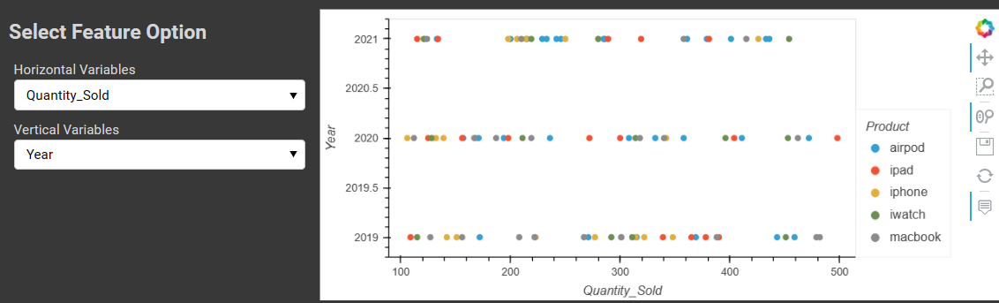

image.png

## Dash IV: Summary Statistics and Distributions

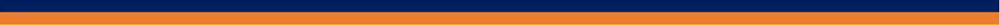

In [ ]:
data.columns

Index(['Year', 'Region', 'Product', 'Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses', 'Sales_Method', 'Revenues_log',
       'Expenses_log'],
      dtype='object')

In [35]:
import pandas as pd
import panel as pn
import hvplot.pandas


# Define the dropdown menu options 
column_options = [ 'Year', 'Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log',
       'Expenses_log']
dropdown_scatter = pn.widgets.Select(options=column_options, name='Select a column for X-axis')
dropdown_box = pn.widgets.Select(options=column_options, name='Select a column')

# Define a function to update the scatter plot based on the dropdown selection
@pn.depends(dropdown_scatter.param.value)
def update_scatter(column):
    plot = data.hvplot.scatter(x=column, y='Revenues', title='Scatter Plot',width=1000, height=400)
    return plot

# Define a function to update the box plot based on the dropdown selection
@pn.depends(dropdown_box.param.value)
def update_box(column):
    plot = data.hvplot.box(y=column, title='Box Plot',width=1000, height=400)
    return plot


# Create Scatter and Boxplots
scatter_plot = pn.Column(dropdown_scatter, update_scatter)
box_plot = pn.Column(dropdown_box, update_box)


# Create Numerical Statistics

# Create Numerical Statistics
table1 = data[['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']].describe().reset_index().hvplot.table(title='Summary Statistics')
table2 = data[['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).reset_index().hvplot.table(title='Quantiles Statistics')


#table1 = data[['age', 'quantity', 'price', 'revenue']].describe().T.hvplot.table(title='Summary Statistics 1')
#table2 = data[['age', 'quantity', 'price', 'revenue']].describe().T.hvplot.table(title='Summary Statistics 2')

# Create Correlation Heatmap
corr = data[['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']].corr()
heat_map = corr.hvplot.heatmap(title='Correlation Heatmap',width=1000, height=500)


dashboard = pn.Tabs(
    ('Scatter Plot', scatter_plot),
    ('Box Plot', box_plot),
    ('Summary Statistics', table1),
    ('Qunatiles Statistics', table2),
    ('Correlation Heatmap', heat_map)  
    
)

# Create a standalone server for the dashboard
dashboard.servable()

Tabs
    [0] Column
        [0] Select(options=['Year', 'Price_per_unit',...], value='Year')
        [1] ParamFunction(function, _pane=HoloViews)
    [1] Column
        [0] Select(options=['Year', 'Price_per_unit',...], value='Year')
        [1] ParamFunction(function, _pane=HoloViews)
    [2] HoloViews(Table, name='Summary Statistics')
    [3] HoloViews(Table, name='Qunatiles Statistics')
    [4] HoloViews(HeatMap, height=500, name='Correlation Heatmap', sizing_mode='fixed', width=1000)

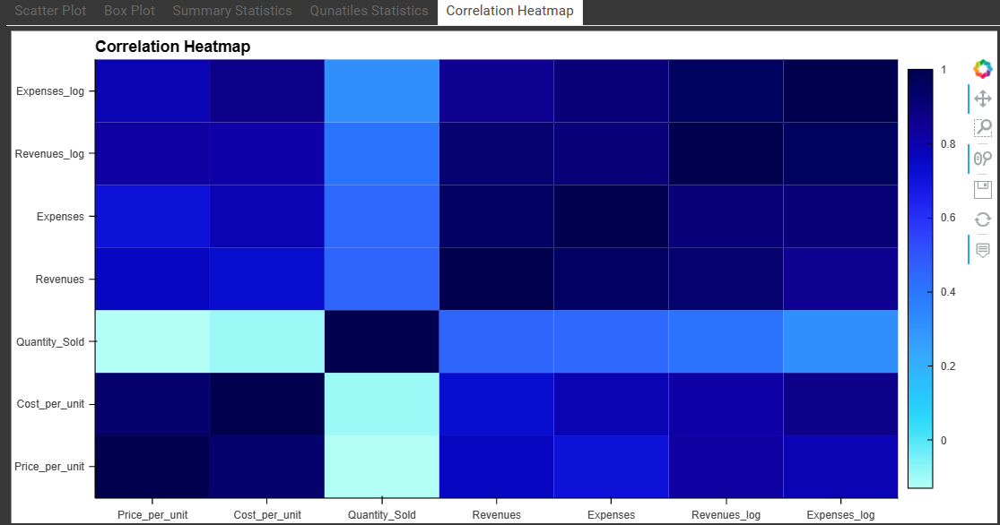

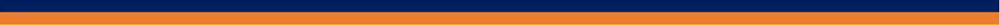

In [36]:
import panel as pn
import pandas as pd
import hvplot.pandas

# Load your dataset into a DataFrame
#df = pd.read_csv('your_dataset.csv')

# Create a list of options for the drop-down menu
options = ['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']

# Create the drop-down menu widget
dropdown = pn.widgets.Select(name='Select Column:', options=options)

# Function to update the chart based on the selected value from the drop-down menu
@pn.depends(dropdown.param.value)
def update_chart(column):
    # Create a chart based on the selected column
    return data.hvplot.box(column, color="red")

# Create a Panel layout with the drop-down menu and chart
dashboard = pn.Column(dropdown, update_chart)

# Create a standalone server for the dashboard
dashboard.servable()

# Embed the dashboard in your notebook
#pn.panel(dashboard).embed()

Column
    [0] Select(options=['Price_per_unit', ...], value='Price_per_unit')
    [1] ParamFunction(function, _pane=HoloViews)

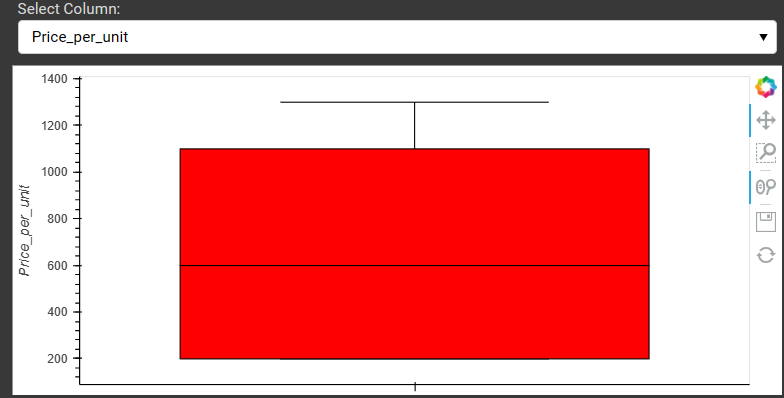

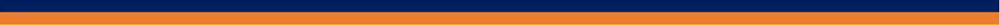

In [38]:
import holoviews as hv
import numpy as np
import pandas as pd
import param
import panel as pn

# Define a function to create the boxplot
def create_boxplot(data, variable):
    return data.hvplot.box(y=variable)

# Define the RoomOccupancy class with the dropdown and plot
class RoomOccupancy(param.Parameterized):
    variable = param.ObjectSelector(default=data.columns[0], objects=list(data.columns))
    
    @param.depends('variable')
    def view(self):
        return create_boxplot(data, self.variable)

# Define the dropdown widget to select the variable
variable_selector = hv.streams.Stream.define('Variable', variable=data.columns[0])(variable=data.columns[0])
variable_menu = pn.widgets.Select(options=list(data.columns), value=data.columns[0])

# Define a function to update the plot based on the dropdown value
def update_boxplot(variable):
    return create_boxplot(data, variable)

# Combine the widgets and the plot using a layout
layout = pn.Row(
    pn.Column(variable_menu),
    pn.Column(hv.DynamicMap(update_boxplot, streams=[variable_selector]))
)

# Create a layout and serve the app
layout.servable()

Row
    [0] Column
        [0] Select(options=['Year', 'Region', ...], value='Year')
    [1] Column
        [0] HoloViews(DynamicMap, height=300, sizing_mode='fixed', width=700)

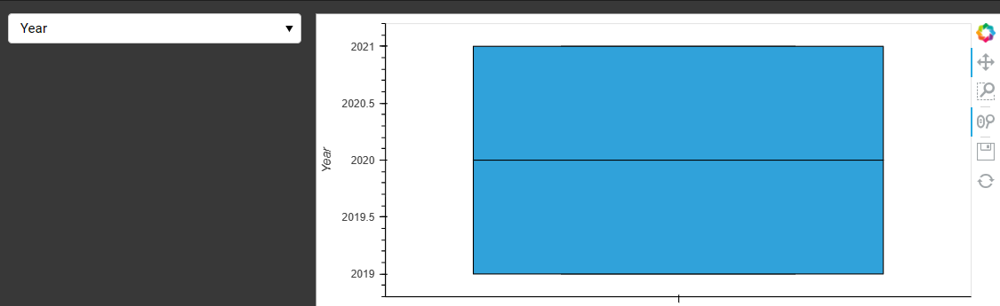

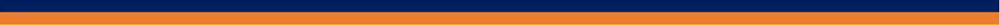

### Descriptive Summary with Maximum observations

In [ ]:
# create a dataframe containing the statistical summary of the numeric columns
df = data.describe(include=np.number).T

# highlight the max values in each column
df = df.style.highlight_max(color="indigo", axis=0)

# display the styled dataframe
display(df)

,count,mean,std,min,25%,50%,75%,max
Year,100.000000,2020.000000,0.816497,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000
Price_per_unit,100.000000,699.500000,436.728830,199.000000,199.000000,599.000000,1099.000000,1299.000000
Cost_per_unit,100.000000,232.800000,154.349597,39.000000,39.000000,289.000000,299.000000,459.000000
Quantity_Sold,100.000000,277.950000,113.030556,106.000000,183.250000,278.500000,366.000000,498.000000
Revenues,100.000000,188138.200000,146950.363300,26467.000000,71679.750000,149344.500000,243609.250000,626378.000000
Expenses,100.000000,63079.330000,53012.263131,5187.000000,16677.500000,49703.500000,95483.250000,221330.000000
Revenues_log,100.000000,11.839285,0.811331,10.183654,11.179956,11.913677,12.403318,13.347709
Expenses_log,100.000000,10.622082,1.019973,8.553911,9.721566,10.813818,11.466706,12.307410


### Descriptive Summary with Minimum observations

In [ ]:
# create a dataframe containing the statistical summary of the numeric columns
df = data.describe(include=np.number).T

# highlight the min values in each column
df = df.style.highlight_min(color="green", axis=0)

# display the styled dataframe
display(df)

,count,mean,std,min,25%,50%,75%,max
Year,100.000000,2020.000000,0.816497,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000
Price_per_unit,100.000000,699.500000,436.728830,199.000000,199.000000,599.000000,1099.000000,1299.000000
Cost_per_unit,100.000000,232.800000,154.349597,39.000000,39.000000,289.000000,299.000000,459.000000
Quantity_Sold,100.000000,277.950000,113.030556,106.000000,183.250000,278.500000,366.000000,498.000000
Revenues,100.000000,188138.200000,146950.363300,26467.000000,71679.750000,149344.500000,243609.250000,626378.000000
Expenses,100.000000,63079.330000,53012.263131,5187.000000,16677.500000,49703.500000,95483.250000,221330.000000
Revenues_log,100.000000,11.839285,0.811331,10.183654,11.179956,11.913677,12.403318,13.347709
Expenses_log,100.000000,10.622082,1.019973,8.553911,9.721566,10.813818,11.466706,12.307410


In [ ]:
import pandas as pd
import numpy as np
import ipywidgets as widgets
from IPython.display import display


# create a function to generate the statistical summary for the selected column
def generate_summary(column):
    df = data[[column]].describe().T
    df = df.style.highlight_max(color="indigo", axis=0)
    display(df)

# create a dropdown menu with the numeric column names
dropdown = widgets.Dropdown(options=data.select_dtypes(include=np.number).columns)

# display the dropdown menu
display(dropdown)

# generate the summary for the initial selection
generate_summary(dropdown.value)

# update the summary when a new selection is made
def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        generate_summary(change['new'])

dropdown.observe(on_change)


Dropdown(options=('Year', 'Price_per_unit', 'Cost_per_unit', 'Quantity_Sold', 'Revenues', 'Expenses', 'Revenue…

,count,mean,std,min,25%,50%,75%,max
Year,100.000000,2020.000000,0.816497,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000


,count,mean,std,min,25%,50%,75%,max
Expenses,100.000000,63079.330000,53012.263131,5187.000000,16677.500000,49703.500000,95483.250000,221330.000000


In [ ]:
import pandas as pd

# create a DataFrame containing the quantiles of the dataset
quantiles_df = data.quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).reset_index()

# highlight the max values in each column
styled_df = quantiles_df.style.highlight_max(color="red", axis=0)

# display the styled DataFrame
styled_df


,index,Year,Price_per_unit,Cost_per_unit,Quantity_Sold,Revenues,Expenses,Revenues_log,Expenses_log
0,0.250000,2019.000000,199.000000,39.000000,183.250000,71679.750000,16677.500000,11.179956,9.721566
1,0.500000,2020.000000,599.000000,289.000000,278.500000,149344.500000,49703.500000,11.913677,10.813818
2,0.600000,2020.000000,799.000000,289.000000,312.200000,195702.200000,67241.800000,12.183955,11.114636
3,0.750000,2021.000000,1099.000000,299.000000,366.000000,243609.250000,95483.250000,12.403318,11.466706
4,0.900000,2021.000000,1299.000000,459.000000,443.800000,393493.300000,138277.700000,12.882678,11.837019
5,0.950000,2021.000000,1299.000000,459.000000,462.500000,505519.450000,164842.600000,13.133297,12.012581
6,0.990000,2021.000000,1299.000000,459.000000,482.160000,622777.370000,220057.850000,13.341944,12.301646


In [ ]:
import pandas as pd
import numpy as np
import ipywidgets as widgets
from IPython.display import display


# create a function to generate the statistical summary for the selected column
def generate_summary(column):
    df = data[[column]].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T
    df = df.style.highlight_max(color="green", axis=0)
    display(df)

# create a dropdown menu with the numeric column names
dropdown = widgets.Dropdown(options=data.select_dtypes(include=np.number).columns)

# display the dropdown menu
display(dropdown)

# generate the summary for the initial selection
generate_summary(dropdown.value)

# update the summary when a new selection is made
def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        generate_summary(change['new'])

dropdown.observe(on_change)


Dropdown(options=('Year', 'Price_per_unit', 'Cost_per_unit', 'Quantity_Sold', 'Revenues', 'Expenses', 'Revenue…

,0.250000,0.500000,0.600000,0.750000,0.900000,0.950000,0.990000
Year,2019.000000,2020.000000,2020.000000,2021.000000,2021.000000,2021.000000,2021.000000


,0.250000,0.500000,0.600000,0.750000,0.900000,0.950000,0.990000
Revenues,71679.750000,149344.500000,195702.200000,243609.250000,393493.300000,505519.450000,622777.370000


In [ ]:
import pandas as pd
import numpy as np
import ipywidgets as widgets
from IPython.display import display

# create a dataframe containing the quantiles of the numeric columns
quantiles_df = data.quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T

# create a dropdown widget to select the axis to highlight max values
axis_dropdown = widgets.Dropdown(
    options=['index', 'columns'],
    value='index',
    description='Highlight axis:',
    layout={'width': 'max-content'}
)

# function to highlight max values in the selected axis
def highlight_max(axis):
    return quantiles_df.style.highlight_max(color="purple", axis=axis)

# display the dropdown and the styled dataframe
display(axis_dropdown)
display(highlight_max(axis_dropdown.value))

# update the styled dataframe when a different axis is selected
def on_dropdown_change(change):
    display(highlight_max(change.new))

axis_dropdown.observe(on_dropdown_change, names='value')


Dropdown(description='Highlight axis:', layout=Layout(width='max-content'), options=('index', 'columns'), valu…

,0.250000,0.500000,0.600000,0.750000,0.900000,0.950000,0.990000
Year,2019.000000,2020.000000,2020.000000,2021.000000,2021.000000,2021.000000,2021.000000
Price_per_unit,199.000000,599.000000,799.000000,1099.000000,1299.000000,1299.000000,1299.000000
Cost_per_unit,39.000000,289.000000,289.000000,299.000000,459.000000,459.000000,459.000000
Quantity_Sold,183.250000,278.500000,312.200000,366.000000,443.800000,462.500000,482.160000
Revenues,71679.750000,149344.500000,195702.200000,243609.250000,393493.300000,505519.450000,622777.370000
Expenses,16677.500000,49703.500000,67241.800000,95483.250000,138277.700000,164842.600000,220057.850000
Revenues_log,11.179956,11.913677,12.183955,12.403318,12.882678,13.133297,13.341944
Expenses_log,9.721566,10.813818,11.114636,11.466706,11.837019,12.012581,12.301646


In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
import panel as pn
import pandas as pd
import hvplot.pandas

# Load your dataset into a DataFrame
#df = pd.read_csv('your_dataset.csv')

# Create a list of options for the drop-down menu
options = [ 'Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']

# Create the drop-down menu widget
dropdown = pn.widgets.Select(name='Select Column:', options=options)

# Function to update the chart based on the selected value from the drop-down menu
@pn.depends(dropdown.param.value)
def update_chart(column):
    # Create a chart based on the selected column
    return data.hvplot.box(column, color="red")

# Create a Panel layout with the drop-down menu and chart
dashboard = pn.Column(dropdown, update_chart)

# Create a standalone server for the dashboard
dashboard.servable()

# Embed the dashboard in your notebook
#pn.panel(dashboard).embed()

Column
    [0] Select(options=['Price_per_unit', ...], value='Price_per_unit')
    [1] ParamFunction(function, _pane=HoloViews)

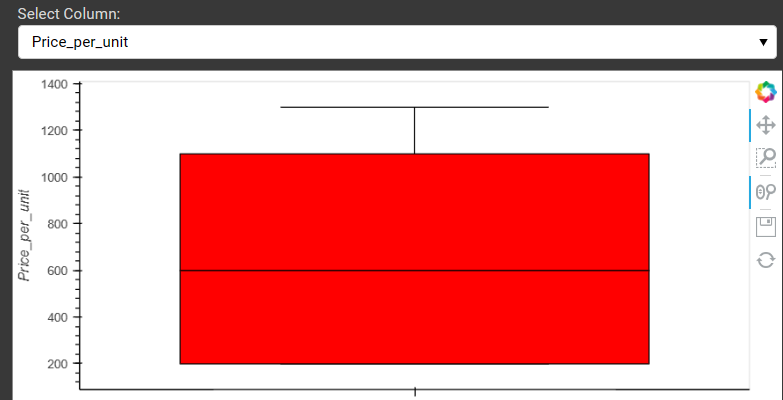

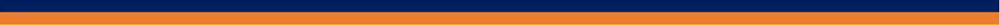

In [ ]:
data.info()

In [ ]:
import panel as pn
import pandas as pd
import hvplot.pandas

# Load your dataset into a DataFrame
#df = pd.read_csv('your_dataset.csv')

# Create a list of options for the drop-down menu
options = ['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']

# Create the drop-down menu widget
dropdown = pn.widgets.Select(name='Select Column:', options=options)

# Function to update the chart based on the selected value from the drop-down menu
@pn.depends(dropdown.param.value)
def update_chart(column):
    # Create a chart based on the selected column
    return data.hvplot.hist(column)

# Create a Panel layout with the drop-down menu and chart
dashboard = pn.Column(dropdown, update_chart)

# Create a standalone server for the dashboard
dashboard.servable()

# Embed the dashboard in your notebook
#pn.panel(dashboard).embed()

Column
    [0] Select(options=['Price_per_unit', ...], value='Price_per_unit')
    [1] ParamFunction(function, _pane=HoloViews)

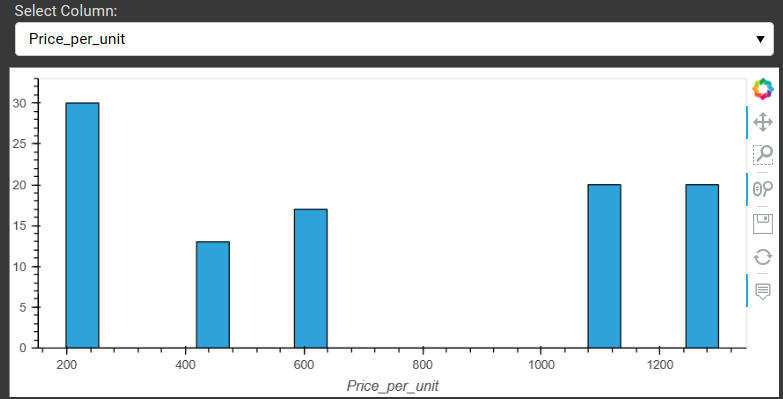

In [ ]:
import panel as pn
import pandas as pd
import hvplot.pandas


# Create a list of options for the drop-down menus
column_options = ['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']
chart_options = ['Histogram', 'Scatter Plot', 'Summary Statistics']

# Create the drop-down menu widgets
column_dropdown = pn.widgets.Select(name='Select Column:', options=column_options)
chart_dropdown = pn.widgets.Select(name='Select Chart Type:', options=chart_options)

# Function to update the chart based on the selected values from the drop-down menus
@pn.depends(column_dropdown.param.value, chart_dropdown.param.value)
def update_chart(column, chart_type):
    # Create a chart based on the selected column and chart type
    if chart_type == 'Histogram':
        return data.hvplot.hist(column, bins=20)
    elif chart_type == 'Scatter Plot':
        return data.hvplot.scatter(x=column, y='Revenues')
    elif chart_type == 'Summary Statistics':
        return data[column].describe().to_frame().hvplot.table()

# Create a Panel layout with the drop-down menus and chart
dashboard = pn.Column(column_dropdown, chart_dropdown, update_chart)

# Display the dashboard
#dashboard.show()


# Create a standalone server for the dashboard
dashboard.servable()


Column
    [0] Select(options=['Price_per_unit', ...], value='Price_per_unit')
    [1] Select(options=['Histogram', ...], value='Histogram')
    [2] ParamFunction(function, _pane=HoloViews)

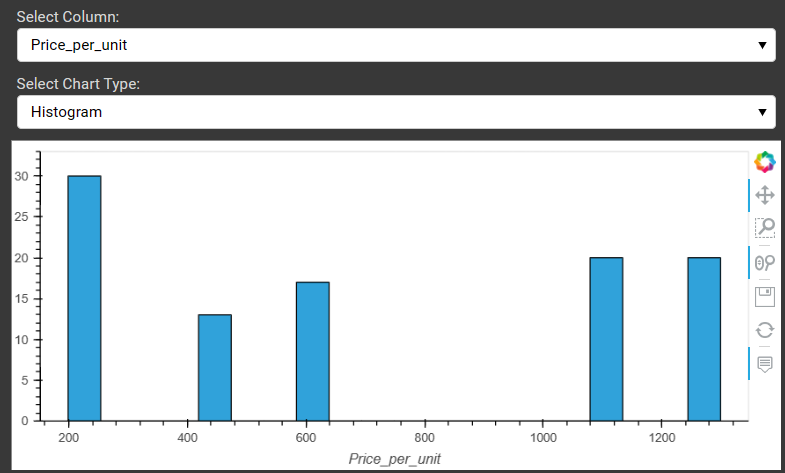

In [ ]:
data.columns

Index(['Year', 'Region', 'Product', 'Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses', 'Sales_Method', 'Revenues_log',
       'Expenses_log'],
      dtype='object')

This code creates a dashboard with multiple tabs containing different types of charts and statistics based on your dataset. The scatter plot and box plot tabs include drop-down menus to select the columns from your dataset to display in the charts. The other tabs display summary statistics tables, a correlation heatmap, a KDE plot, and a bar plot.

In [ ]:
import pandas as pd
import panel as pn
import hvplot.pandas

# Load your dataset into a DataFrame
#data = pd.read_csv('your_dataset.csv')

# Define the dropdown menu options [ALL Columns]
column_options = [ 'Year', 'Region', 'Product', 'Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses', 'Sales_Method', 'Revenues_log',
       'Expenses_log']
dropdown_scatter = pn.widgets.Select(options=column_options, name='Select a column for X-axis')
dropdown_box = pn.widgets.Select(options=column_options, name='Select a column')

# Define a function to update the scatter plot based on the dropdown selection
@pn.depends(dropdown_scatter.param.value)
def update_scatter(column):
    plot = data.hvplot.scatter(x=column, y='Revenues', title='Scatter Plot')
    return plot

# Define a function to update the box plot based on the dropdown selection
@pn.depends(dropdown_box.param.value)
def update_box(column):
    plot = data.hvplot.box(y=column, title='Box Plot')
    return plot

# Create Scatter and Boxplots
scatter_plot = pn.Column(dropdown_scatter, update_scatter)
box_plot = pn.Column(dropdown_box, update_box)

# Create Numerical Statistics
table1 = data[['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']].describe().T.hvplot.table(title='Summary Statistics')
table2 = data[['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T.hvplot.table(title='Quantiles Statistics')

# Create Correlation Heatmap
corr = data[['Price_per_unit', 'Cost_per_unit','Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log','Expenses_log']].corr()
heat_map = corr.hvplot.heatmap(title='Correlation Heatmap')

# Creat KDE and Bar Charts
kde_plot = data.hvplot.kde(y='Revenues', by=None, title='KDE Plot')
#bar_plot1 = data.hvplot.bar( x='gender', stacked=True, title='Bar Plot Gender')
bar_plot2 = data.hvplot.bar( x='Sales_Method', stacked=True, title='bar Plot cut')
#bar_plot3 = data.hvplot.bar( x='payment_method', stacked=True, title='Bar Plot Payment Methods')
bar_plot4 = data.hvplot.bar( x='Region', stacked=True, title='Bar Plot Color')
# Create a Panel layout with the charts and statistics

dashboard = pn.Tabs(
    ('Scatter Plot', scatter_plot),
    ('Box Plot', box_plot),
    ('Summary Statistics', table1),
    ('Quantiles Statistics', table2),
    ('Correlation Heatmap', heat_map),
    ('KDE Plot', kde_plot),
    ('Bar Plot', bar_plot4)
    
    
)

# Display the dashboard
#dashboard.show()

# Create a standalone server for the dashboard
dashboard.servable()

Tabs
    [0] Column
        [0] Select(options=['Year', 'Region', ...], value='Year')
        [1] ParamFunction(function, _pane=HoloViews)
    [1] Column
        [0] Select(options=['Year', 'Region', ...], value='Year')
        [1] ParamFunction(function, _pane=HoloViews)
    [2] HoloViews(Table, name='Summary Statistics')
    [3] HoloViews(Table, name='Quantiles Statistics')
    [4] HoloViews(HeatMap, height=300, name='Correlation Heatmap', sizing_mode='fixed', width=700)
    [5] HoloViews(Distribution, height=300, name='KDE Plot', sizing_mode='fixed', width=700)
    [6] HoloViews(Bars, height=300, name='Bar Plot', sizing_mode='fixed', width=700)

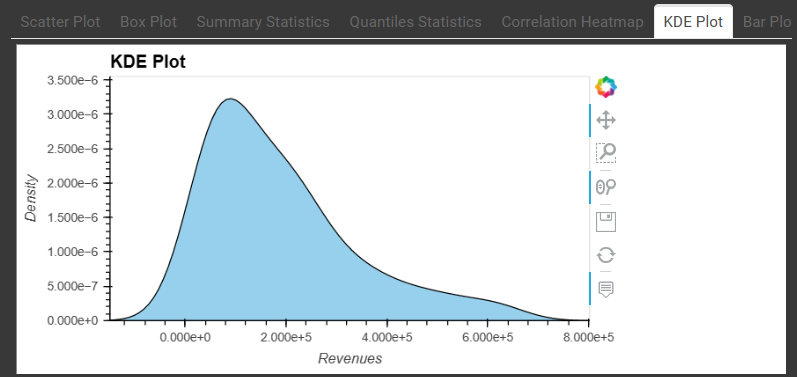

In [ ]:
data.columns

Index(['Year', 'Region', 'Product', 'Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses', 'Sales_Method', 'Revenues_log',
       'Expenses_log'],
      dtype='object')

In [ ]:
# Creating a sunburst chart 
import plotly.express as px

fig = px.sunburst(
    data,
    path=["Region"],
    values="Revenues",
    color="Revenues",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

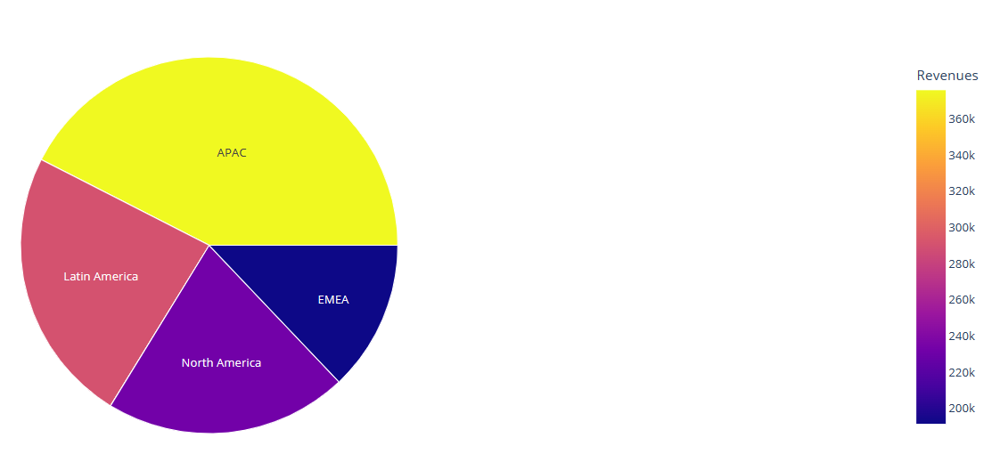

In [ ]:
# Creating a sunburst chart for Cash Ratio vs GICS Sectors
import plotly.express as px

fig = px.sunburst(
    data,
    path=["Product"],
    values="Revenues",
    color="Revenues",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

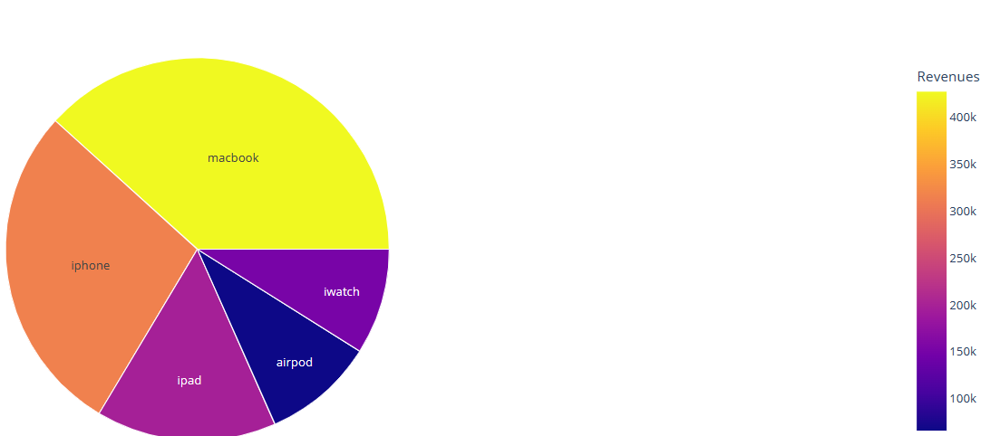

In [ ]:
# Creating a sunburst chart for Cash Ratio vs GICS Sectors
import plotly.express as px

fig = px.sunburst(
    data,
    path=["Sales_Method"],
    values="Revenues",
    color="Revenues",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

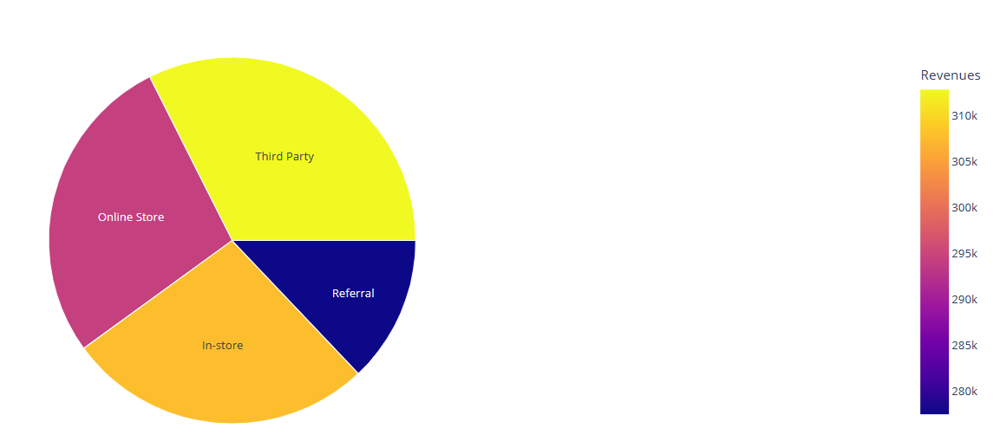

In [ ]:
data.columns

Index(['Year', 'Region', 'Product', 'Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses', 'Sales_Method', 'Revenues_log',
       'Expenses_log'],
      dtype='object')

In [ ]:
import plotly.express as px
fig = px.sunburst(data, path=['Region', 'Product', 'Sales_Method'], values='Expenses', color='Product',
                  color_discrete_map={'(?)':'red', 'Lunch':'gold', 'Dinner':'green'})
fig.show()

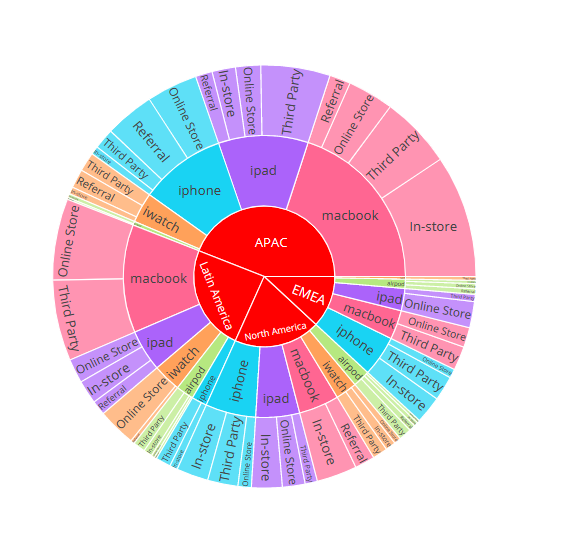

In [ ]:
import plotly.express as px
fig = px.sunburst(data, path=['Region', 'Product', 'Sales_Method'], values='Revenues', color='Product',
                  color_discrete_map={'(?)':'red', 'Lunch':'gold', 'Dinner':'green'})
fig.show()

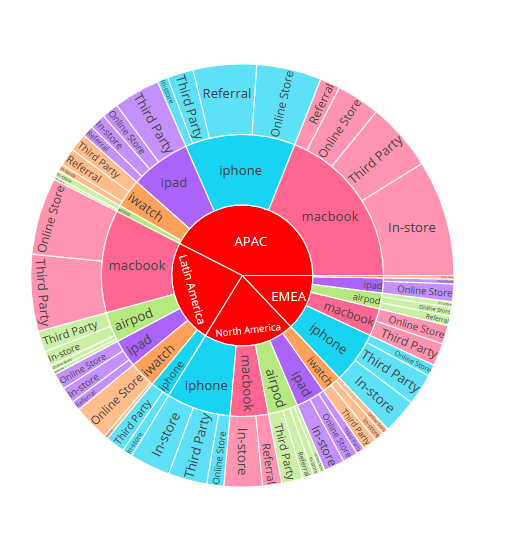

In [ ]:
# Sunburst of a rectangular DataFrame with discrete color argument in px.sunburst
import plotly.express as px
fig = px.sunburst(data, path=['Region', 'Product'], values='Expenses')
fig.show()

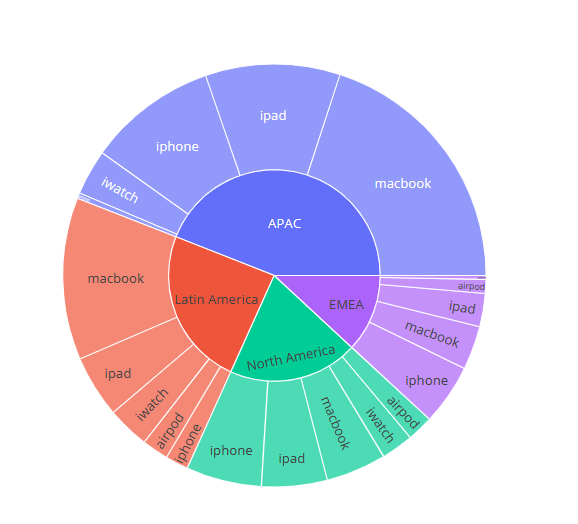

In [ ]:
# Sunburst of a rectangular DataFrame with discrete color argument in px.sunburst
import plotly.express as px
fig = px.sunburst(data, path=['Sales_Method', 'Product'], values='Revenues', color='Product')
fig.show()

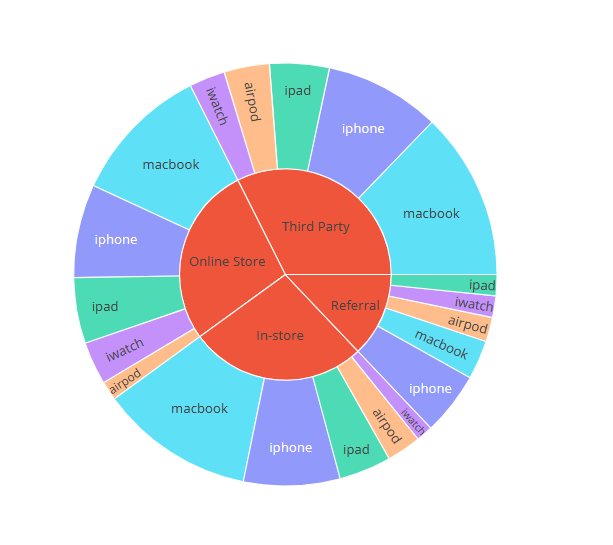

In [ ]:
import plotly.express as px
fig = px.sunburst(data, path=['Region', 'Sales_Method', 'Product'], values='Revenues', color='Sales_Method',
                  color_discrete_map={'(?)':'black', 'Lunch':'gold', 'Dinner':'darkblue'})
fig.show()

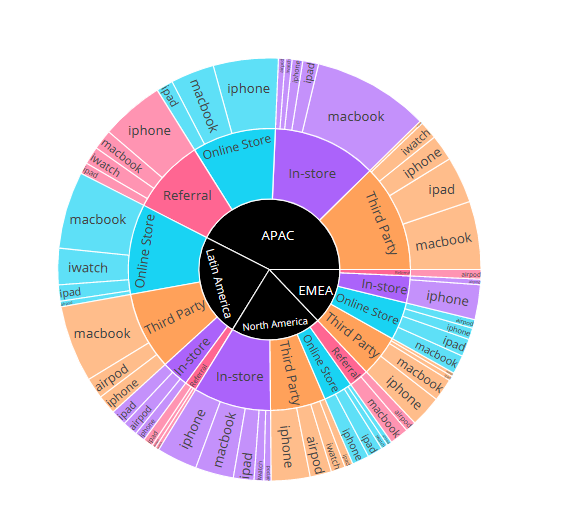

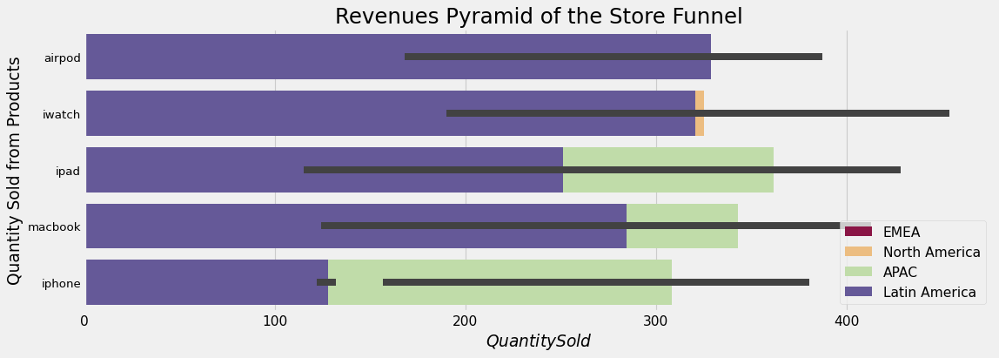

In [ ]:
# Distribution of Population of Pyramid of Marketing Funnel Dataset
plt.figure(figsize=(15,5), dpi= 80)
group_col = 'Region'
order_of_bars = data.Product.unique()[::-1]
colors = [plt.cm.Spectral(i/float(len(data[group_col].unique())-1)) for i in range(len(data[group_col].unique()))]

for c, group in zip(colors, data[group_col].unique()):
    sns.barplot(x='Quantity_Sold', y='Product', data=data.loc[data[group_col]==group, :], order=order_of_bars, color=c, label=group)

# Decorations    
plt.xlabel("$Quantity Sold$")
plt.ylabel("Quantity Sold from Products")
plt.yticks(fontsize=12)
plt.title("Revenues Pyramid of the Store Funnel", fontsize=22)
plt.legend()
plt.show()


In [ ]:
data.head(3)

,Year,Region,Product,Price_per_unit,Cost_per_unit,Quantity_Sold,Revenues,Expenses,Sales_Method,Revenues_log,Expenses_log
0,2019,EMEA,iphone,1099.00,289.00,314.00,344537.00,90602.00,In-store,12.75,11.41
1,2019,North America,iphone,1099.00,289.00,301.00,330469.00,86902.00,Third Party,12.71,11.37
2,2019,APAC,macbook,1299.00,459.00,482.00,626378.00,221330.00,Online Store,13.35,12.31


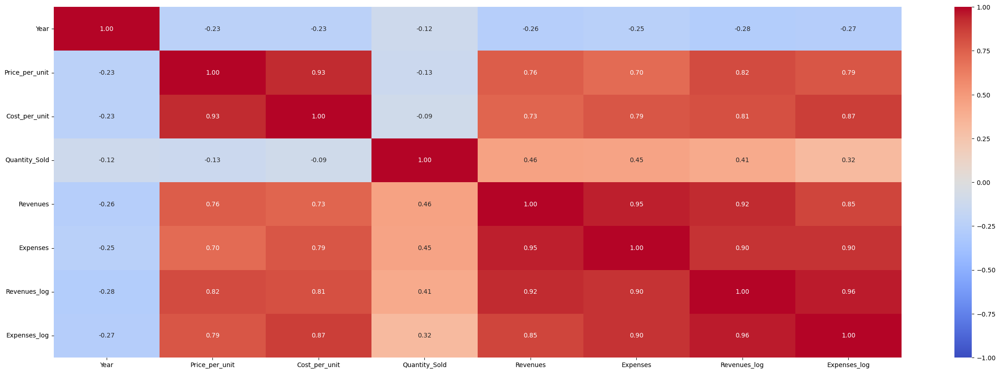

In [ ]:
# Displaying the correlation between numerical variables of the dataset
plt.figure(figsize=(30, 10))
sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="coolwarm")
plt.show()

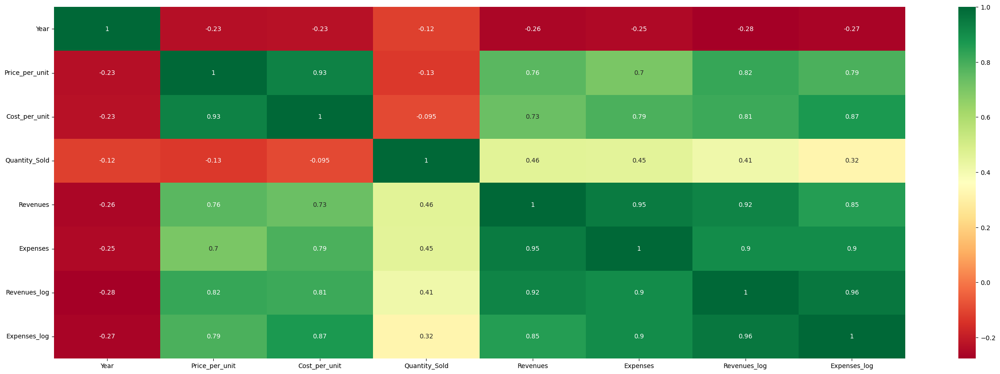

In [ ]:
# using heatmap
correlation = data.corr()  # creating a 2-D Matrix with correlation plots
plt.figure(figsize=(30, 10))
sns.heatmap(correlation, annot=True, cmap="RdYlGn");

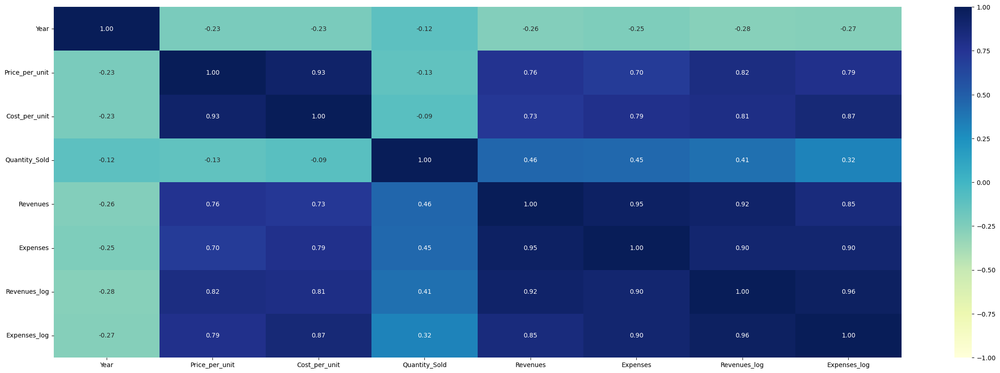

In [ ]:
# creates heatmap showing correlation of numeric columns in data
plt.figure(figsize=(30, 10))
sns.heatmap(data.corr(), vmin=-1, vmax=1, cmap="YlGnBu", annot=True, fmt=".2f");

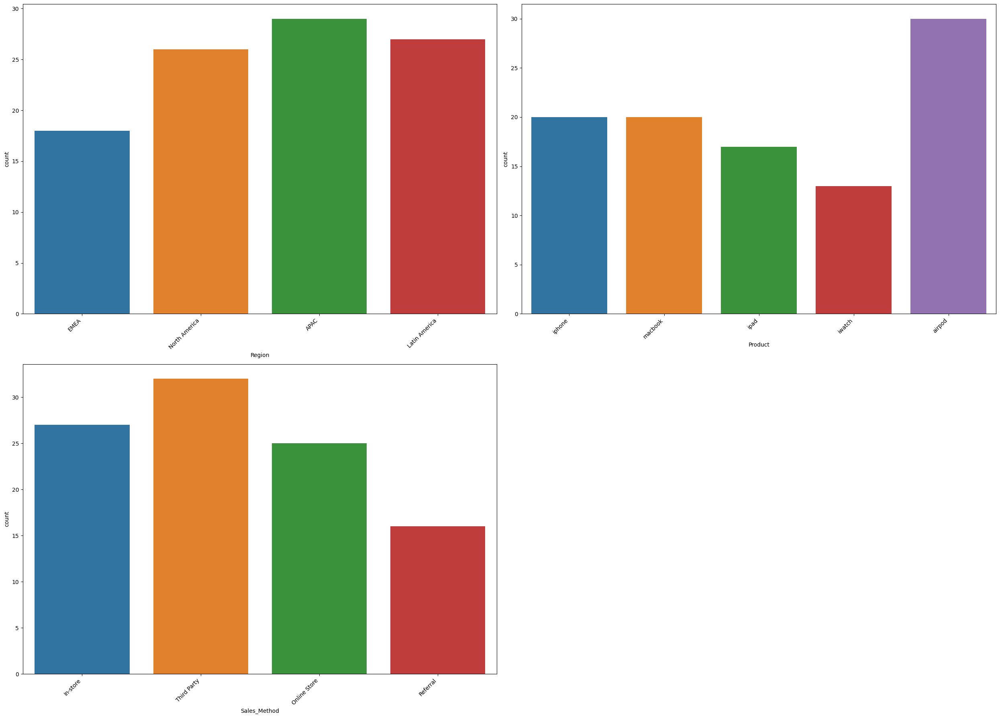

In [ ]:
# Checking the count plots of the categorical Variables
cols = 2
rows = 2
num_cols = data.select_dtypes(include="object")
fig = plt.figure(figsize=(25, 18))

for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.countplot(x=data[col], ax=ax)

    plt.xticks(rotation=45, ha="right")

fig.tight_layout()
plt.show()

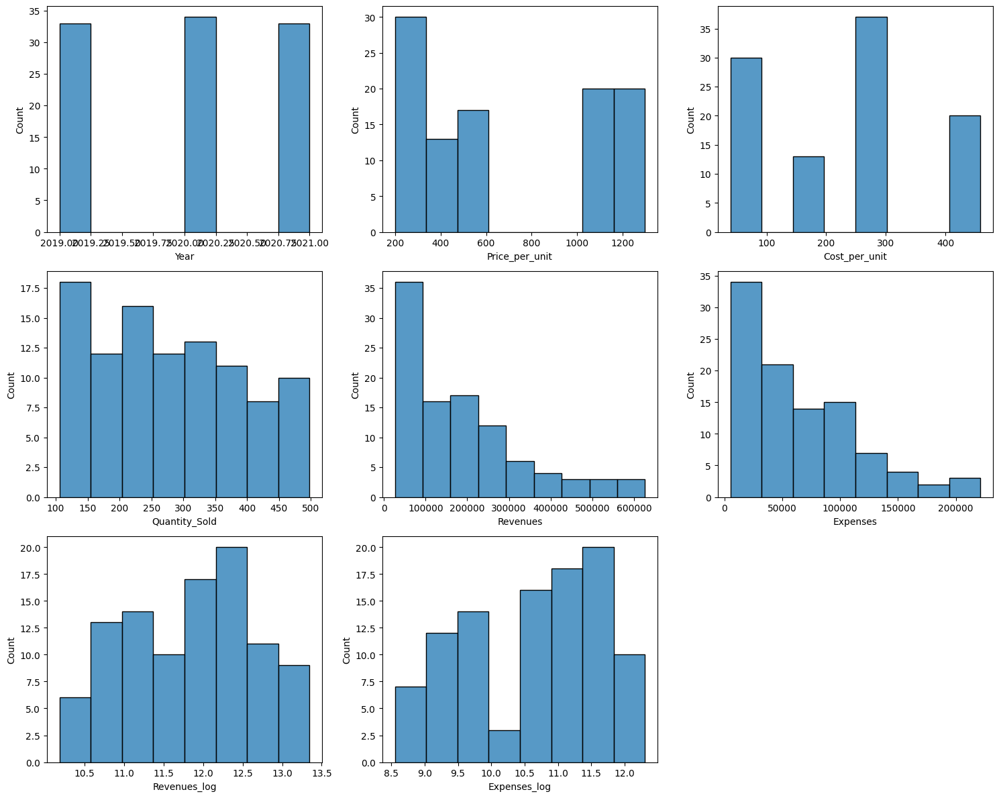

In [ ]:
# Checking the histogram plot of numerical variables of the entire dataset
cols = 3
rows = 3
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(cols * 5, rows * 4))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.histplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

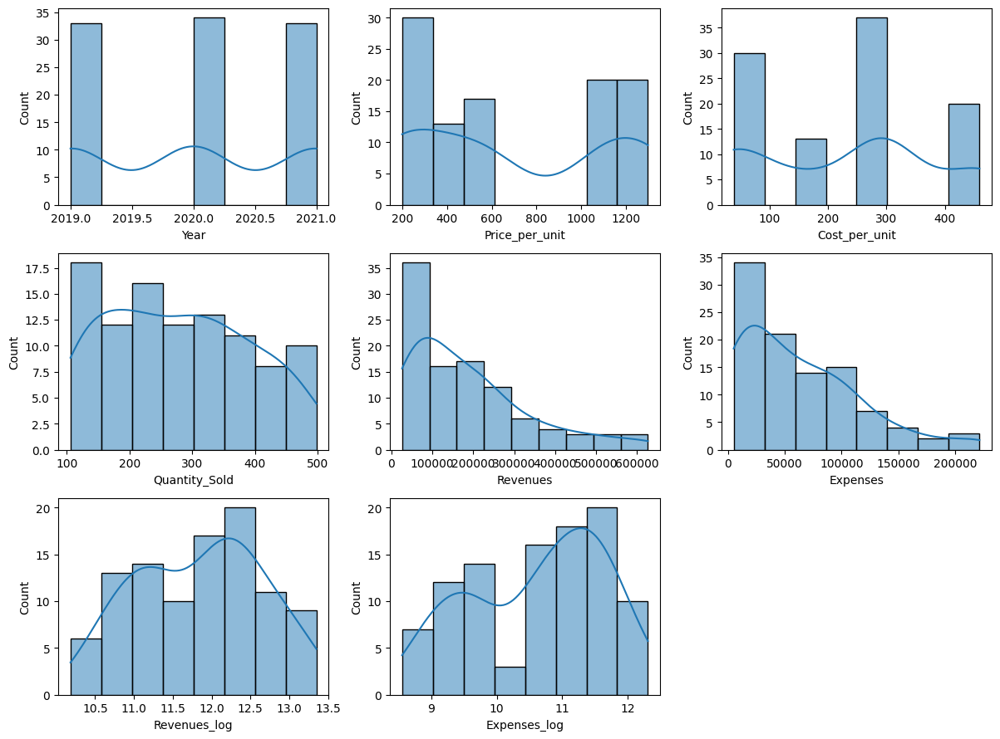

In [ ]:
# Checking the histogram plot of numerical variables of the entire dataset
cols = 3
rows = 3
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(cols * 4, rows * 3))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.histplot(x=data[col], kde=True, ax=ax)

fig.tight_layout()
plt.show()

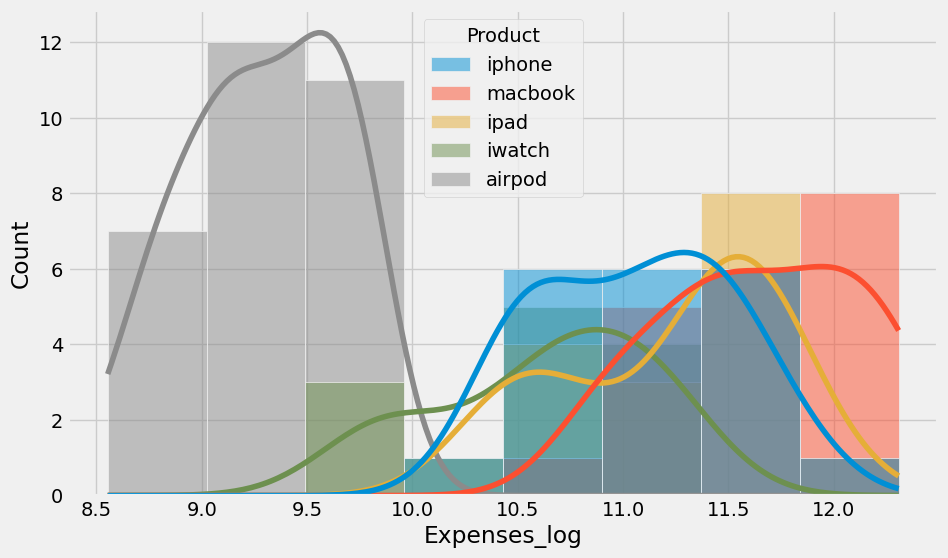

In [ ]:
# ploting a histogram of Co_emissions vs Fuel Type
plt.figure(figsize = (10,6))
sns.histplot(data = data, x = 'Expenses_log', hue = 'Product', kde = True);

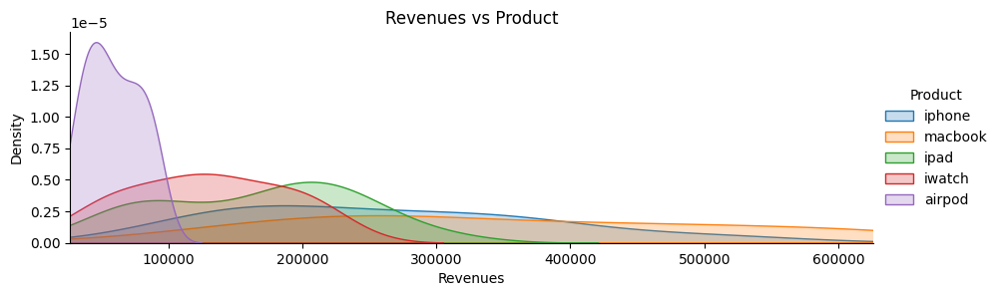

In [ ]:
facet = sns.FacetGrid(data, hue="Product",aspect=3)
facet.map(sns.kdeplot,"Revenues",shade= True)
facet.set(xlim=(data["Revenues"].min(), data["Revenues"].max()))
facet.add_legend()
plt.title('Revenues vs Product')
plt.show()

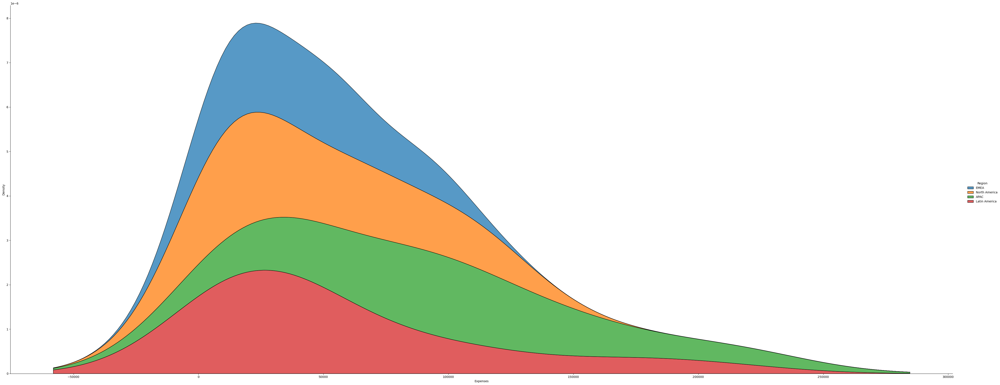

In [ ]:
# Ploting a displot of Price Change vs GICS Sectors
sns.displot(
    data=data,
    x="Expenses",
    hue="Region",
    multiple="stack",
    kind="kde",
    height=18,
    aspect=2.5,
);

In [ ]:
### function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(25, 9))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

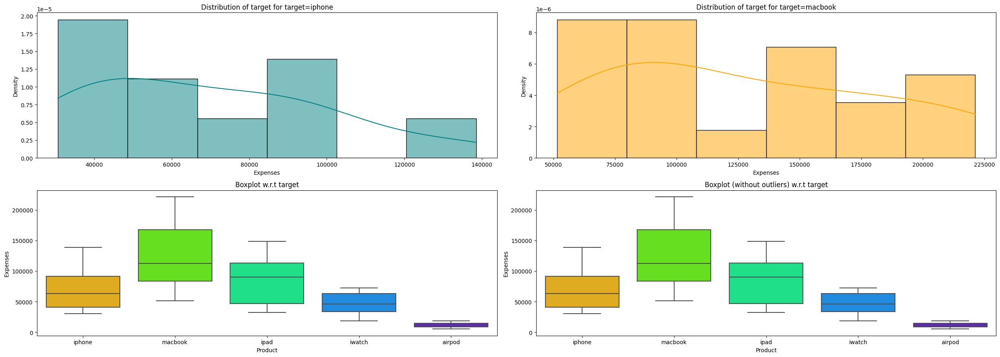

In [ ]:
distribution_plot_wrt_target(data, "Expenses", "Product")  

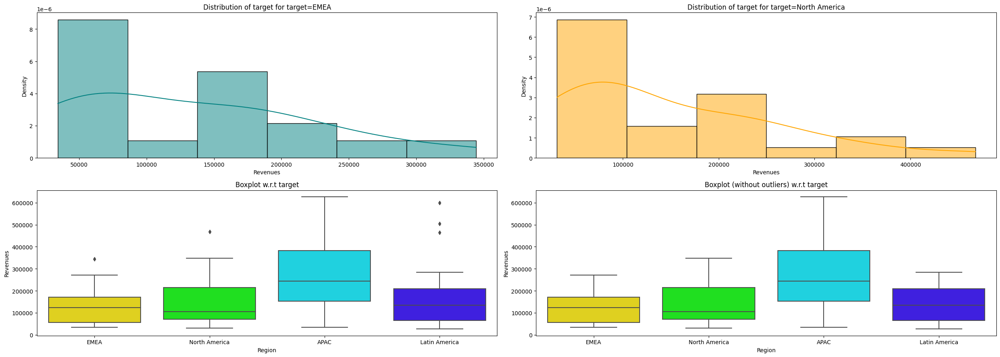

In [ ]:
distribution_plot_wrt_target(data, "Revenues", "Region")  

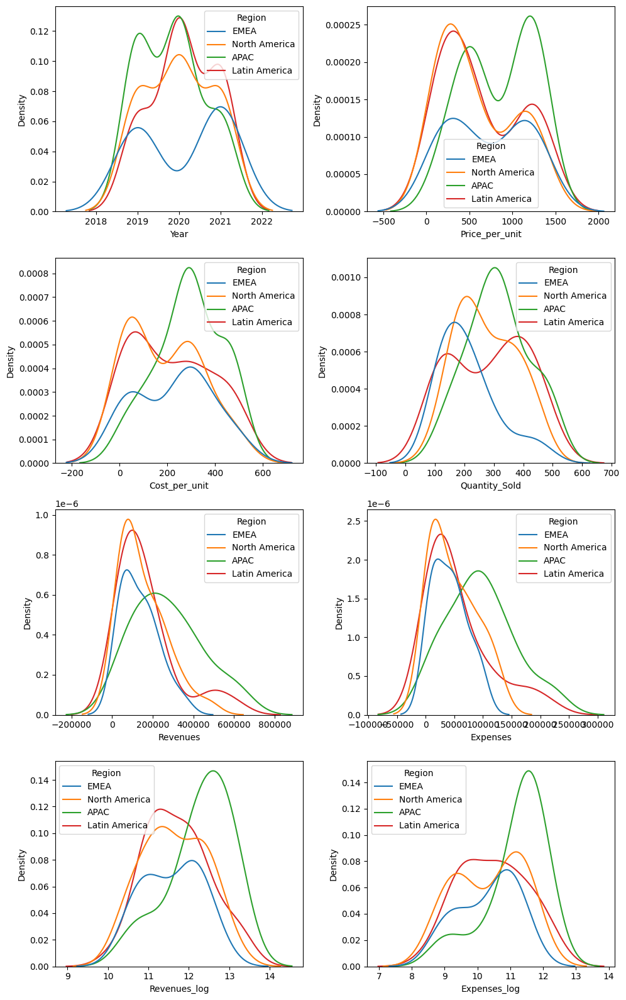

In [ ]:
# Checking the KDE plot of numerical variables of the entire dataset
cols = 2
rows = 4
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(cols * 5, rows * 4))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.kdeplot(x=data[col], hue='Region',data=data)

fig.tight_layout()
plt.show()

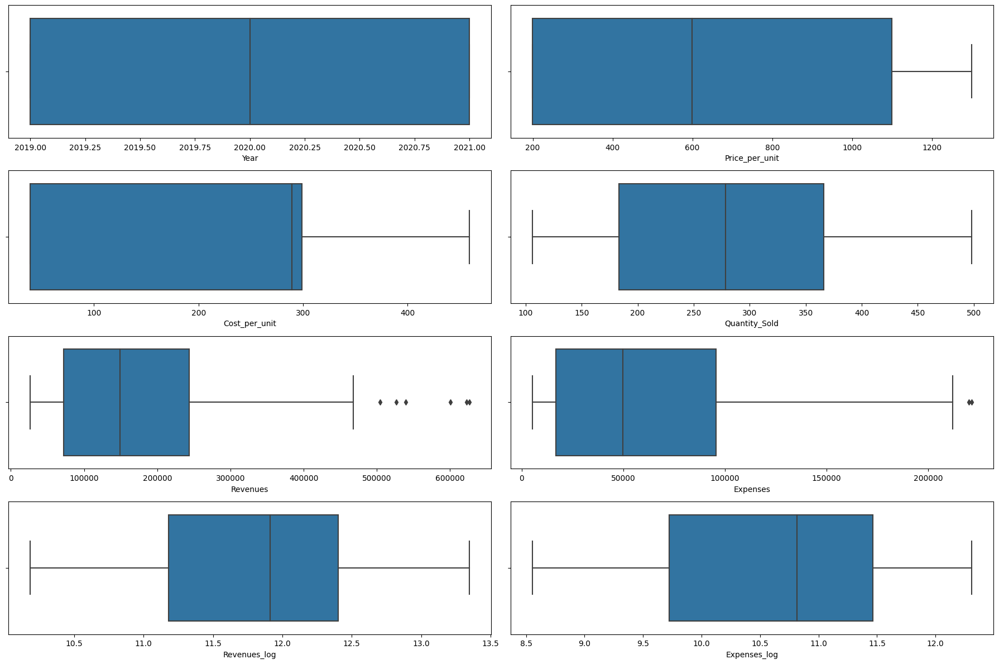

In [ ]:
# Checking the boxplot of the numerical variable of the dataset
cols = 2
rows = 4
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(18, 12))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.boxplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

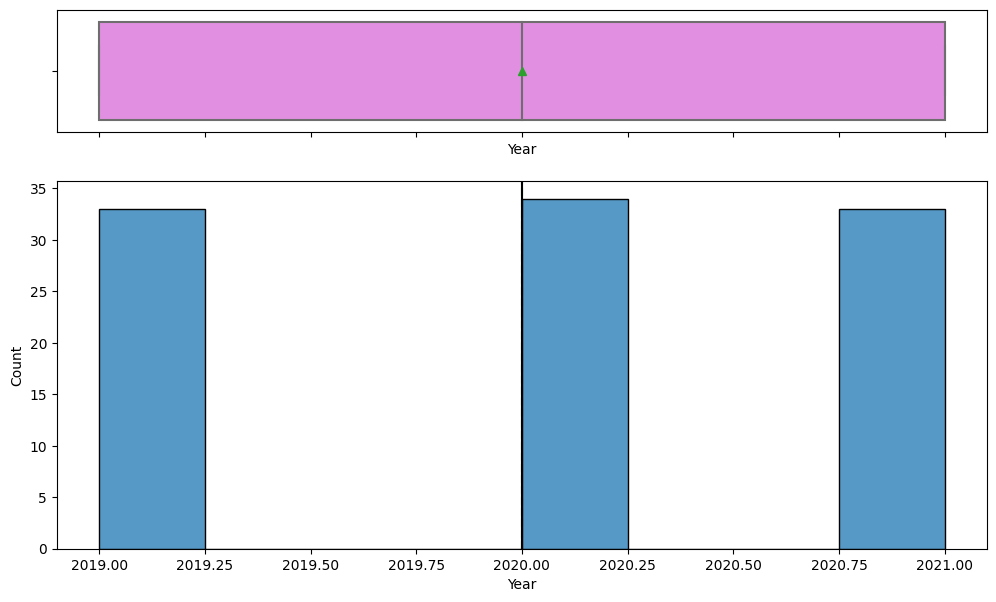

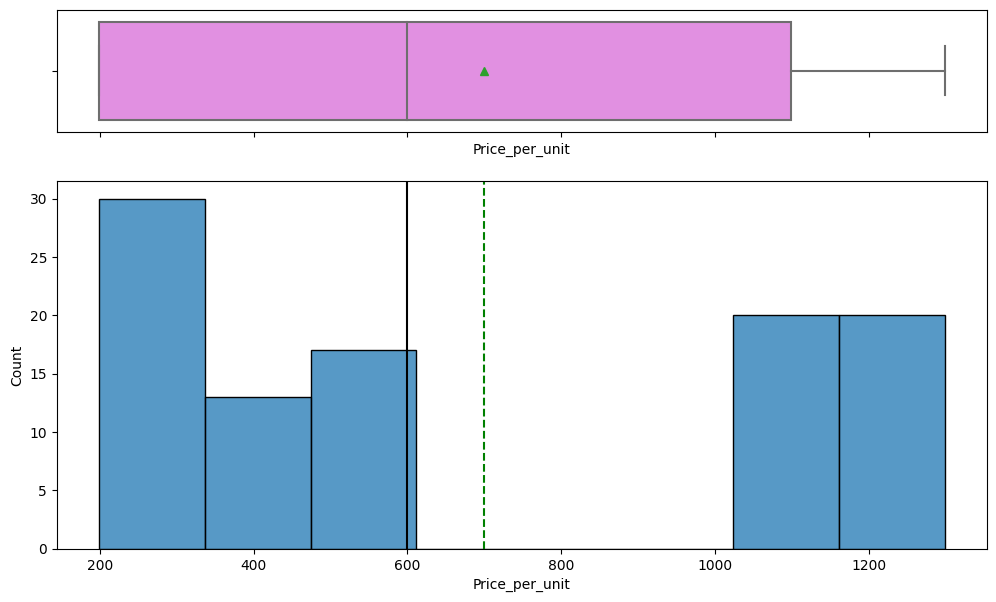

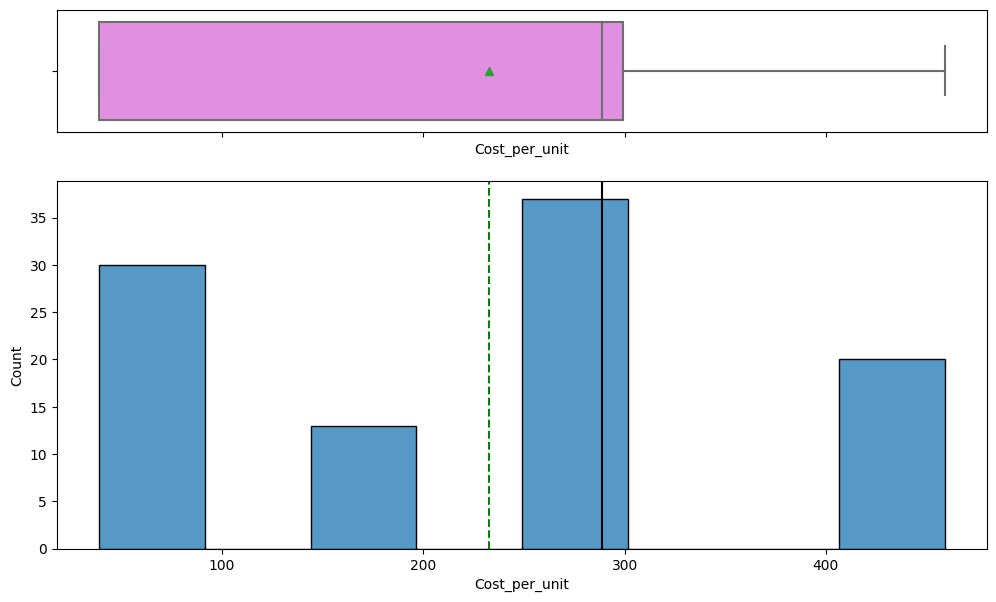

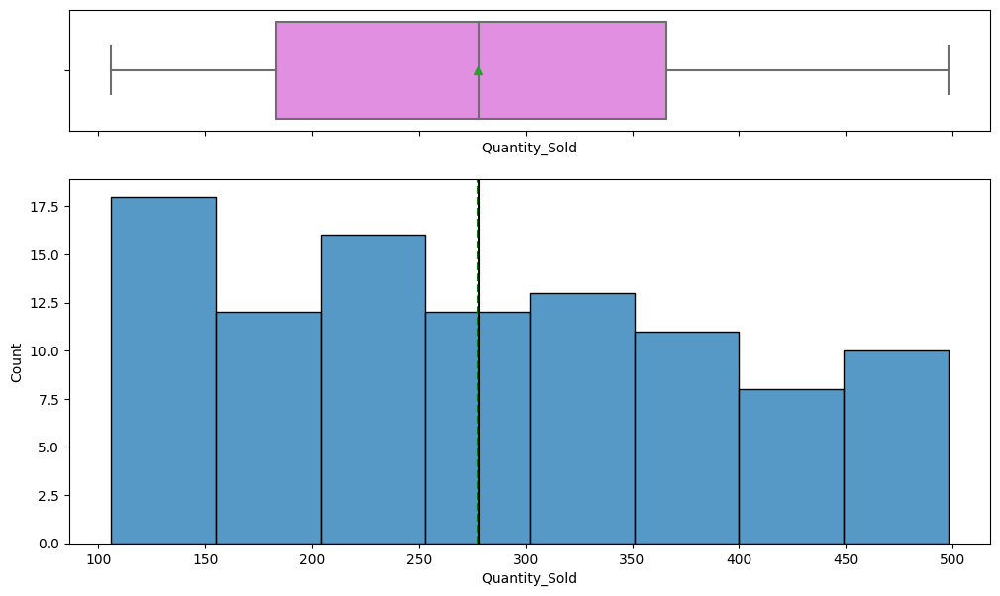

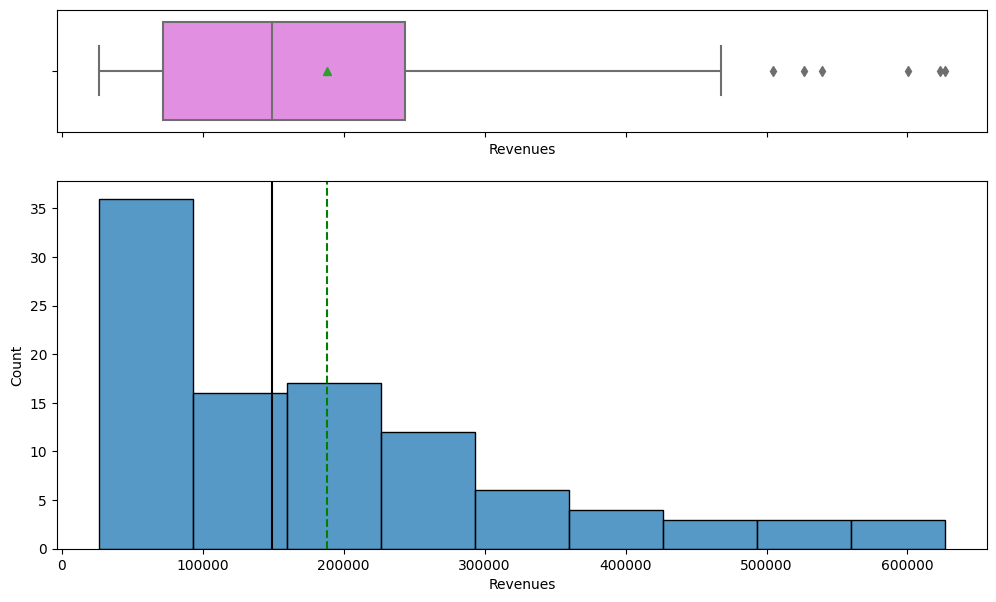

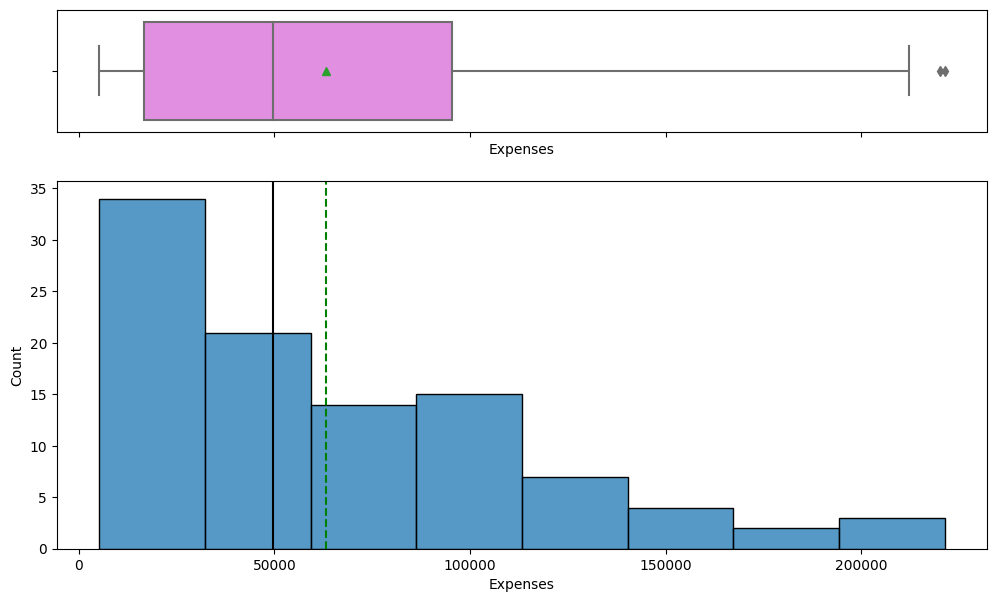

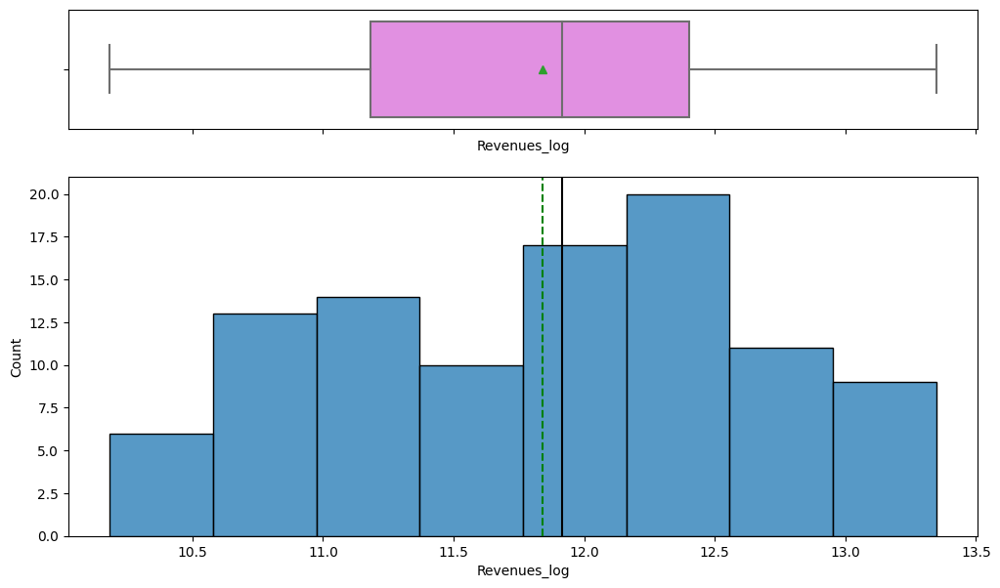

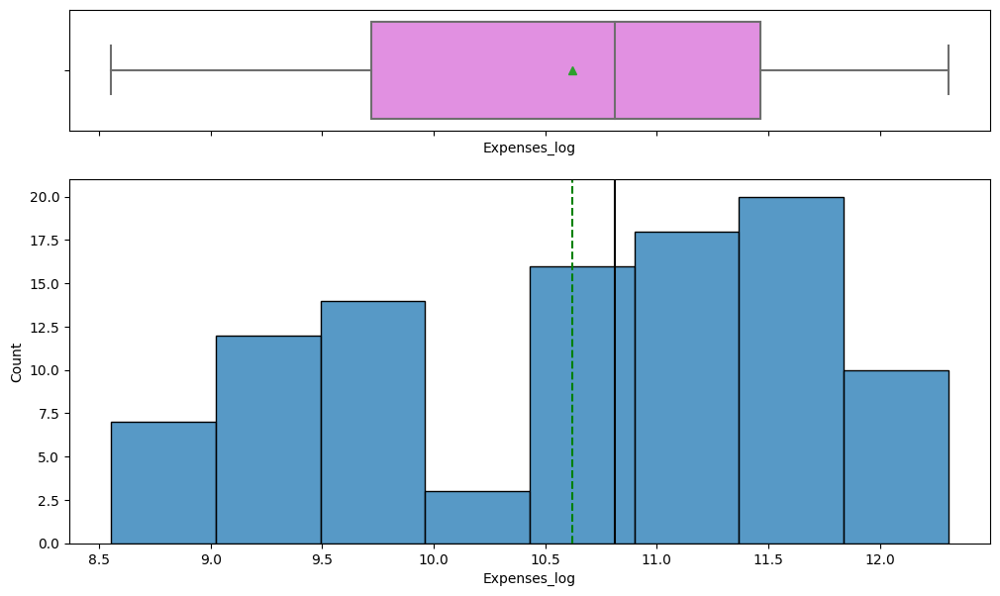

In [ ]:
num_cols = data.select_dtypes(exclude="object").columns
for feature in num_cols:
    histogram_boxplot(
        data, feature, figsize=(12, 7), kde=False, bins=None
    )  ## Please change the dataframe name as you define while reading the data

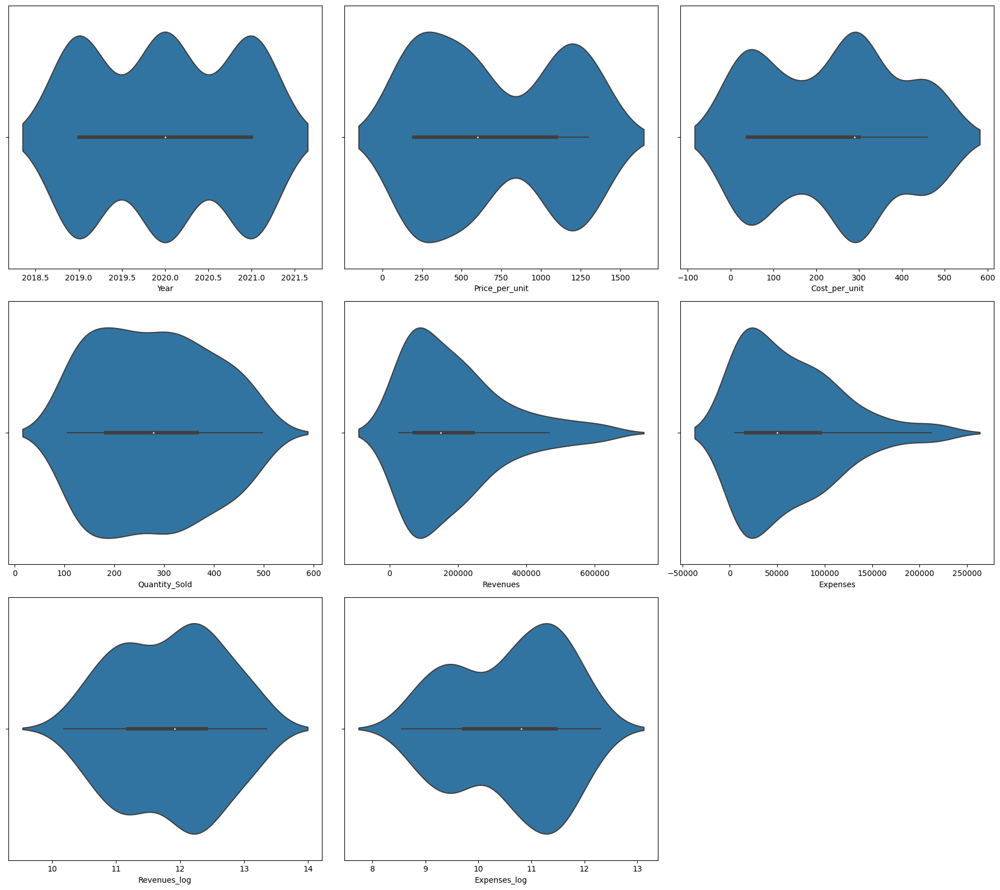

In [ ]:
# Checking the voilin plot of the numerical variables
cols = 3
rows = 3
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(18, 16))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.violinplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

In [ ]:
import plotly.express as px
fig = px.parallel_categories(data, color="Quantity_Sold", color_continuous_scale=px.colors.sequential.Inferno)
fig.show()

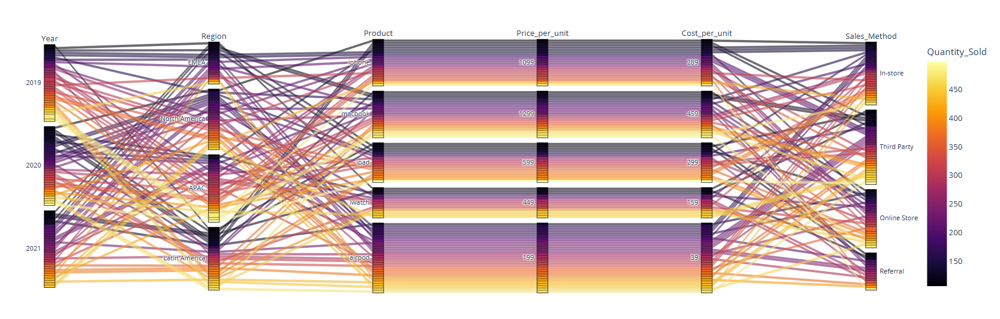

In [ ]:
data.columns

Index(['Year', 'Region', 'Product', 'Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses', 'Sales_Method', 'Revenues_log',
       'Expenses_log'],
      dtype='object')

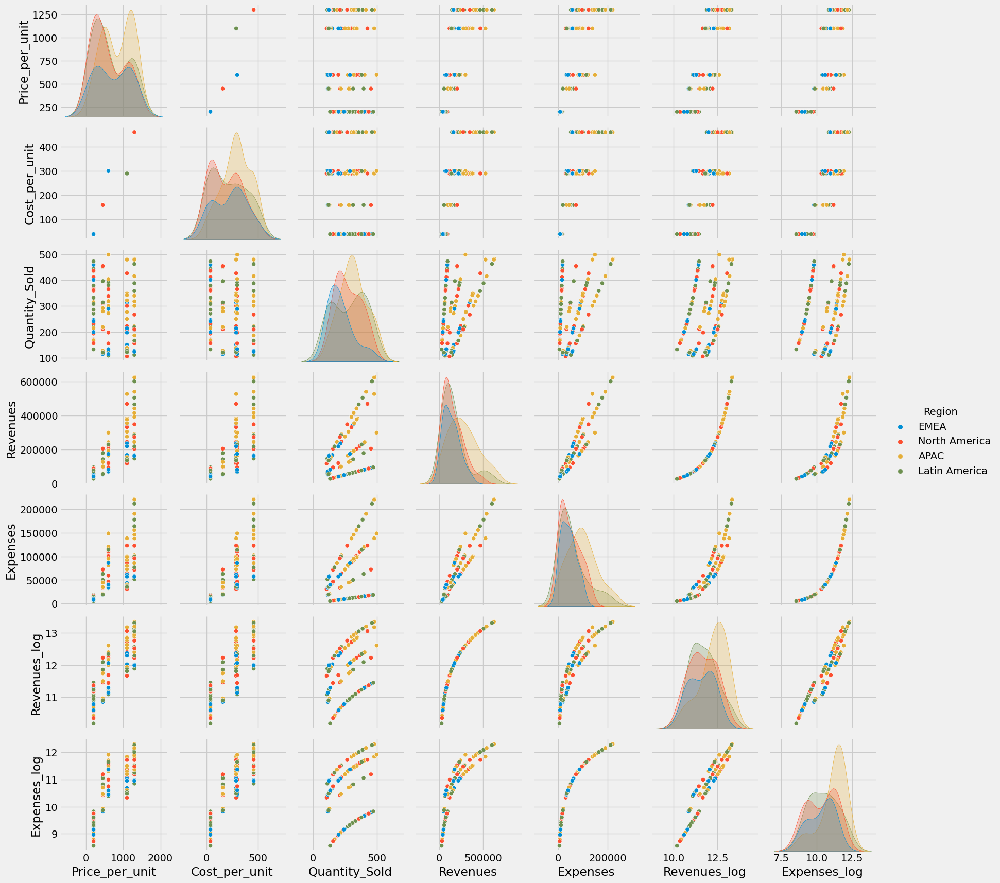

In [ ]:
cols=['Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses','Revenues_log',
       'Expenses_log']
plt.style.use("fivethirtyeight")
sns.pairplot(data, hue="Region", vars=cols, diag_kind="kde");

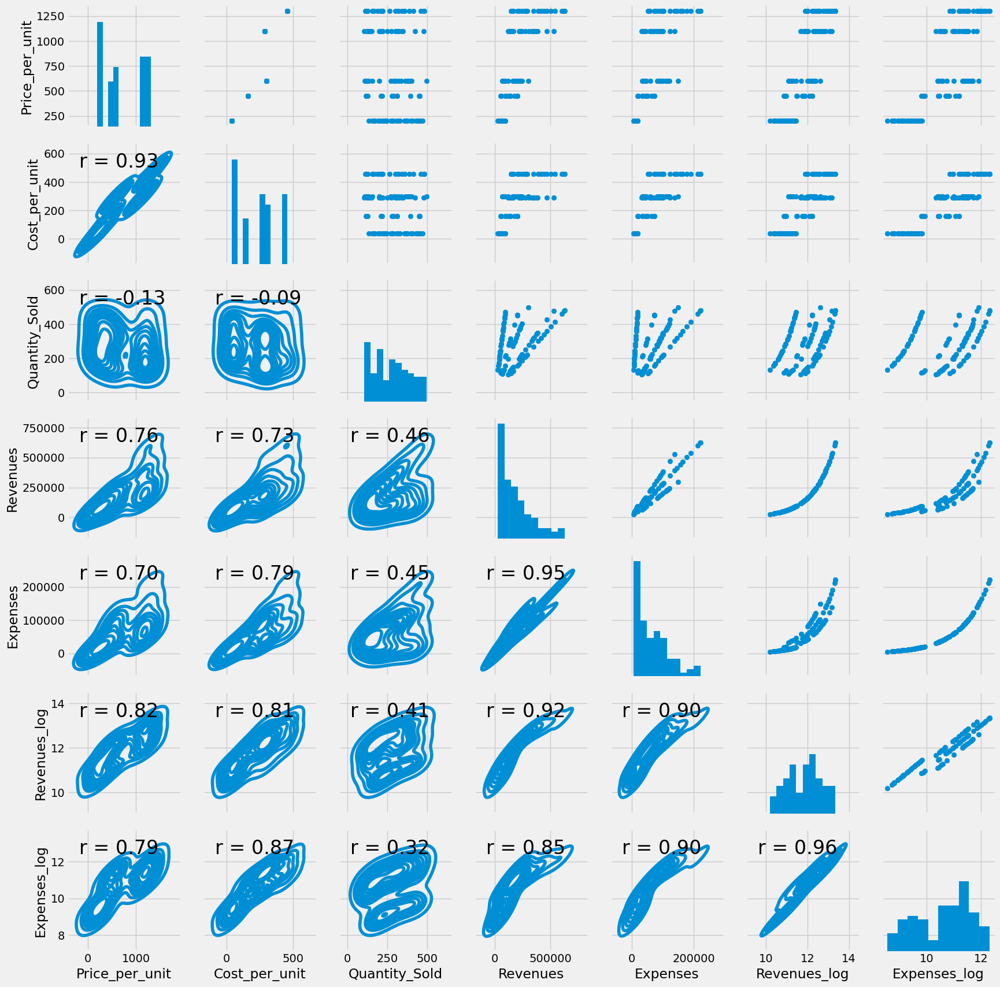

In [ ]:
import scipy

# Function to calculate correlation coefficient between two variables
def corrfunc(x, y, **kwgs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r), xy=(0.1, 0.8), xycoords=ax.transAxes, size=24)


# Create a PairGrid
g = sns.PairGrid(data=data, vars=['Price_per_unit', 'Cost_per_unit',
       'Quantity_Sold', 'Revenues', 'Expenses', 'Revenues_log',
       'Expenses_log'])

# Map a scatterplot to the upper triangle
g.map_upper(plt.scatter)

# Map a histogram to the diagonal
g.map_diag(plt.hist)

# Map a kde plot to the lower triangle
g.map_lower(sns.kdeplot)

# Map the correlation coefficient to the lower diagonal
g.map_lower(corrfunc);